https://transformer-circuits.pub/2023/monosemantic-features#setup-autoencoder
Sparse Autoencoder implementation

I want to build a simple binary classifier CNN for cats and dogs (a public easily accessible dataset) and use the sparse autoencoder technique in the paper in the link to see the features that it looks for in determining whether it is a cat or dog. Is this feasible? How to implement it in Jupyter with Pytorch?

In [ ]:
#pip installs, colab button

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, random_split
import kagglehub

# 1) DOWNLOAD DATA
dataset_path = kagglehub.dataset_download("shaunthesheep/microsoft-catsvsdogs-dataset")
device = "mps" if torch.backends.mps.is_available() else "cuda"

# 2) SETUP DATA
transform = transforms.Compose([transforms.Resize((64, 64)), transforms.ToTensor()])
dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=transform)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# 3) SIMPLE CNN
class SimpleCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.relu = nn.ReLU()
        self.fc = nn.Linear(32*16*16, 2)  # 64x64 -> after two pools -> 16x16
    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = x.view(x.size(0), -1)
        return self.fc(x)

model = SimpleCNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# 4) TRAIN CNN (VERY SHORT DEMO EPOCHS)
for epoch in range(2):
    model.train()
    for imgs, labels in train_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

# 5) EXTRACT FEATURE ACTIVATIONS FROM THE LAST CONV LAYER
def get_features(net, loader):
    features = []
    net.eval()
    with torch.no_grad():
        for imgs, _ in loader:
            x = imgs.to(device)
            x = net.conv1(x); x = net.relu(x); x = net.pool(x)
            x = net.conv2(x); x = net.relu(x); x = net.pool(x)
            features.append(x.cpu().view(x.size(0), -1))
    return torch.cat(features, dim=0)

feature_maps = get_features(model, train_loader)

# 6) SPARSE AUTOENCODER ON FEATURES
class SparseAutoencoder(nn.Module):
    def __init__(self, input_dim, hidden_dim=64):
        super().__init__()
        self.encoder = nn.Linear(input_dim, hidden_dim)
        self.decoder = nn.Linear(hidden_dim, input_dim)
        self.relu = nn.ReLU()
    def forward(self, x):
        encoded = self.relu(self.encoder(x))
        decoded = self.decoder(encoded)
        return decoded, encoded

sae = SparseAutoencoder(feature_maps.shape[1]).to(device)
optimizer_sae = optim.Adam(sae.parameters(), lr=1e-3)
mse_loss = nn.MSELoss()

def l1_regularization(module, factor=1e-4):
    return factor * torch.sum(torch.abs(module.encoder.weight))

feature_maps = feature_maps.to(device)
for epoch in range(2):
    sae.train()
    optimizer_sae.zero_grad()
    decoded, encoded = sae(feature_maps)
    loss = mse_loss(decoded, feature_maps) + l1_regularization(sae)
    loss.backward()
    optimizer_sae.step()

print("Done! Model and sparse autoencoder trained (demo).")

100%|████████████████████████████████████████| 788M/788M [00:19<00:00, 41.6MB/s]

Extracting files...



/Users/ryan/Projects/XAI/Xenv/lib/python3.11/site-packages/PIL/TiffImagePlugin.py:949: UserWarning: Truncated File Read
  warnings.warn(str(msg))


UnidentifiedImageError: cannot identify image file <_io.BufferedReader name='/Users/ryan/.cache/kagglehub/datasets/shaunthesheep/microsoft-catsvsdogs-dataset/versions/1/PetImages/Cat/666.jpg'>

In [5]:
import torch, torchvision, kagglehub
import torch.nn as nn, torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, random_split
from PIL import Image
import os

# Enable truncated images to load (helps with some corruptions)
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

# 1) DOWNLOAD DATA
dataset_path = kagglehub.dataset_download("shaunthesheep/microsoft-catsvsdogs-dataset")
device = "mps" if torch.backends.mps.is_available() else "cpu"

# 2) SETUP DATA
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])
dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=transform)

# Filter out any invalid images
def is_valid(path):
    try:
        Image.open(path).verify()
        return True
    except Exception:
        return False

dataset.samples = [s for s in dataset.samples if is_valid(s[0])]
print("Valid samples:", len(dataset.samples))

train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# 3) DEFINE A SIMPLE CNN FOR CATS VS DOGS
class SimpleCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.relu = nn.ReLU()
        self.fc = nn.Linear(32*16*16, 2)  # 64x64 -> after 2 pools -> 16x16
    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = x.view(x.size(0), -1)
        return self.fc(x)
model = SimpleCNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# 4) TRAIN THE CNN (DEMO: 2 EPOCHS)
for epoch in range(2):
    model.train()
    for imgs, labels in train_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        loss = criterion(model(imgs), labels)
        loss.backward()
        optimizer.step()
    print(f"Epoch {epoch+1}/2, Loss: {loss.item():.4f}")

# 5) EXTRACT FEATURE ACTIVATIONS FROM THE LAST CONV LAYER
def get_features(net, loader):
    features = []
    net.eval()
    with torch.no_grad():
        for imgs, _ in loader:
            x = imgs.to(device)
            x = net.pool(net.relu(net.conv1(x)))
            x = net.pool(net.relu(net.conv2(x)))
            features.append(x.cpu().view(x.size(0), -1))
    return torch.cat(features, dim=0)
feature_maps = get_features(model, train_loader)

# 6) TRAIN A SPARSE AUTOENCODER ON THE FEATURE ACTIVATIONS
class SparseAutoencoder(nn.Module):
    def __init__(self, input_dim, hidden_dim=64):
        super().__init__()
        self.encoder = nn.Linear(input_dim, hidden_dim)
        self.decoder = nn.Linear(hidden_dim, input_dim)
        self.relu = nn.ReLU()
    def forward(self, x):
        encoded = self.relu(self.encoder(x))
        decoded = self.decoder(encoded)
        return decoded, encoded
sae = SparseAutoencoder(feature_maps.shape[1]).to(device)
optimizer_sae = optim.Adam(sae.parameters(), lr=1e-3)
mse_loss = nn.MSELoss()
def l1_regularization(module, factor=1e-3):
    return factor * torch.sum(torch.abs(module.encoder.weight))
feature_maps = feature_maps.to(device)
for epoch in range(2):
    sae.train()
    optimizer_sae.zero_grad()
    decoded, encoded = sae(feature_maps)
    loss = mse_loss(decoded, feature_maps) + l1_regularization(sae)
    loss.backward()
    optimizer_sae.step()
    print(f"SAE Epoch {epoch+1}/2, Loss: {loss.item():.4f}")

print("Done! CNN and sparse autoencoder trained (demo).")

Valid samples: 24998
Epoch 1/2, Loss: 0.0000
Epoch 2/2, Loss: 0.0000
SAE Epoch 1/2, Loss: 0.4367
SAE Epoch 2/2, Loss: 0.4136
Done! CNN and sparse autoencoder trained (demo).


monitor training progress with tqdm. loss was 0 both epochs, so diagnose that. report the accuracy of the model. visualize the sparse autoencoder outputs. explain function 5 and how it works. save both models to /Users/ryan/Projects/XAI/myXAI and add a true or false statement (by default true) that if true will retrain the models, if false will use the latest saved model. the saved models should increment their naming by the date and time. guide me to be able to take the sparse autoencoder (SAE) and manually have the opportunity to identify and classify the features that it extracts, in a convenient format so that i could potentially hand it off to chatgpt to classify the features

Valid samples: 24998
Classes: ['PetImages']


/var/folders/7b/3z6d319x6yx7scj5rrm1jx6w0000gn/T/ipykernel_35779/1927727791.py:101: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(cnn_model_

Loaded CNN model from: /Users/ryan/Projects/XAI/myXAI/XAI_Assignment6/SimpleCNN_20250219_174811.pt
Validation Accuracy: 100.00%
Feature maps shape: torch.Size([24998, 8192])
Feature labels shape: torch.Size([24998])
Label distribution (0=Cat, 1=Dog): {np.int64(0): np.int64(24998)}
Loaded SAE model from: /Users/ryan/Projects/XAI/myXAI/XAI_Assignment6/SparseAutoencoder_20250219_174850.pt


/var/folders/7b/3z6d319x6yx7scj5rrm1jx6w0000gn/T/ipykernel_35779/1927727791.py:198: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sae.load_state_dict(torch.load(sae_model_pa

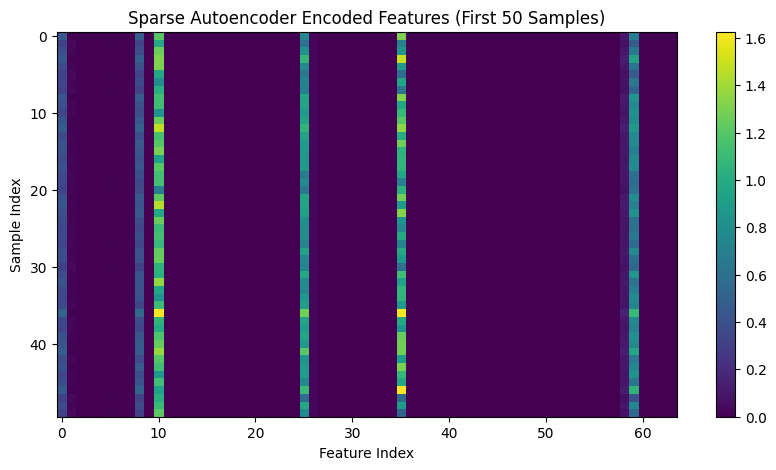

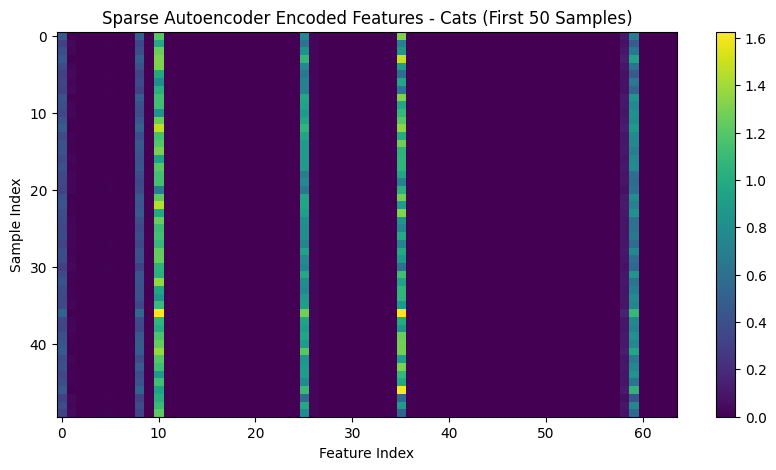

No dog samples found in the features.
Encoded features saved to: /Users/ryan/Projects/XAI/myXAI/XAI_Assignment6/encoded_features_20250219_180927.csv


In [11]:
import os, datetime, torch, torchvision, kagglehub
import torch.nn as nn, torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, random_split
from PIL import Image, ImageFile
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Allow truncated images to load (helps with corrupt images)
ImageFile.LOAD_TRUNCATED_IMAGES = True

# ----- CONFIGURATION -----
RETRAIN_MODELS = True  # Set to False to load the latest saved models
SAVE_DIR = "/Users/ryan/Projects/XAI/myXAI/XAI_Assignment6"
os.makedirs(SAVE_DIR, exist_ok=True)
device = "mps" if torch.backends.mps.is_available() else "cpu"

# ----- 1) DOWNLOAD AND PREPARE DATA -----
dataset_path = kagglehub.dataset_download("shaunthesheep/microsoft-catsvsdogs-dataset")

# Define transforms and dataset
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])
dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=transform)

# Filter out any invalid images
def is_valid(path):
    try:
        Image.open(path).verify()
        return True
    except Exception:
        return False

dataset.samples = [s for s in dataset.samples if is_valid(s[0])]
print("Valid samples:", len(dataset.samples))
print("Classes:", dataset.classes)

# Split dataset into train/validation
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# For feature extraction (to get balanced classes), use full dataset loader
full_loader = DataLoader(dataset, batch_size=32, shuffle=False)

# ----- 2) DEFINE A SIMPLE CNN FOR CATS VS DOGS -----
class SimpleCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.relu = nn.ReLU()
        self.fc = nn.Linear(32*16*16, 2)  # 64x64 -> after 2 poolings -> 16x16
    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = x.view(x.size(0), -1)
        return self.fc(x)

# ----- 3) TRAIN OR LOAD CNN MODEL -----
cnn_model_path = None
if not RETRAIN_MODELS:
    cnn_models = [f for f in os.listdir(SAVE_DIR) if "SimpleCNN" in f]
    if cnn_models:
        cnn_model_path = os.path.join(SAVE_DIR, sorted(cnn_models)[-1])
        
if RETRAIN_MODELS or cnn_model_path is None:
    model = SimpleCNN().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    
    print("Training CNN...")
    for epoch in range(5):
        model.train()
        epoch_loss = 0.0
        progress = tqdm(train_loader, desc=f"Epoch {epoch+1}/2")
        for imgs, labels in progress:
            imgs, labels = imgs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
            progress.set_postfix(loss=loss.item())
        print(f"Epoch {epoch+1} Loss: {epoch_loss/len(train_loader):.4f}")
    # Save CNN model with timestamp
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    cnn_model_path = os.path.join(SAVE_DIR, f"SimpleCNN_{timestamp}.pt")
    torch.save(model.state_dict(), cnn_model_path)
    print("Saved CNN model to:", cnn_model_path)
else:
    model = SimpleCNN().to(device)
    model.load_state_dict(torch.load(cnn_model_path, map_location=device))
    print("Loaded CNN model from:", cnn_model_path)

# ----- 4) EVALUATE CNN ACCURACY ON VALIDATION SET -----
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for imgs, labels in val_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        total += labels.size(0)
        correct += (preds == labels).sum().item()
accuracy = correct / total
print(f"Validation Accuracy: {accuracy*100:.2f}%")

# ----- 5) EXTRACT FEATURES ALONG WITH LABELS -----
def get_features_and_labels(net, loader):
    """
    Extract feature activations from the last conv layer along with their labels.
    For each batch:
      - Pass images through conv1 and conv2 (with ReLU and pooling).
      - Flatten the output into a 1D vector per image.
      - Collect the corresponding labels.
    Returns:
      - features: tensor of shape (N, feature_dim)
      - labels: tensor of shape (N,)
    """
    features, all_labels = [], []
    net.eval()
    with torch.no_grad():
        for imgs, labels in loader:
            x = imgs.to(device)
            x = net.pool(net.relu(net.conv1(x)))
            x = net.pool(net.relu(net.conv2(x)))
            features.append(x.cpu().view(x.size(0), -1))
            all_labels.append(labels)
    return torch.cat(features, dim=0), torch.cat(all_labels, dim=0)

# Use full_loader for balanced class distribution
feature_maps, feature_labels = get_features_and_labels(model, full_loader)
print("Feature maps shape:", feature_maps.shape)
print("Feature labels shape:", feature_labels.shape)

# Check label distribution
unique, counts = np.unique(feature_labels.numpy(), return_counts=True)
print("Label distribution (0=Cat, 1=Dog):", dict(zip(unique, counts)))

# ----- 6) TRAIN OR LOAD SPARSE AUTOENCODER (SAE) ON FEATURES -----
class SparseAutoencoder(nn.Module):
    def __init__(self, input_dim, hidden_dim=64):
        super().__init__()
        self.encoder = nn.Linear(input_dim, hidden_dim)
        self.decoder = nn.Linear(hidden_dim, input_dim)
        self.relu = nn.ReLU()
    def forward(self, x):
        encoded = self.relu(self.encoder(x))
        decoded = self.decoder(encoded)
        return decoded, encoded

sae_model_path = None
if not RETRAIN_MODELS:
    sae_models = [f for f in os.listdir(SAVE_DIR) if "SparseAutoencoder" in f]
    if sae_models:
        sae_model_path = os.path.join(SAVE_DIR, sorted(sae_models)[-1])

if RETRAIN_MODELS or sae_model_path is None:
    sae = SparseAutoencoder(feature_maps.shape[1]).to(device)
    optimizer_sae = optim.Adam(sae.parameters(), lr=1e-3)
    mse_loss = nn.MSELoss()
    def l1_regularization(module, factor=1e-4):
        return factor * torch.sum(torch.abs(module.encoder.weight))
    
    feature_maps = feature_maps.to(device)
    print("Training Sparse Autoencoder...")
    for epoch in range(2):
        sae.train()
        epoch_loss = 0.0
        progress = tqdm(range(0, feature_maps.size(0), 32), desc=f"SAE Epoch {epoch+1}/2")
        for i in progress:
            batch = feature_maps[i:i+32]
            optimizer_sae.zero_grad()
            decoded, encoded = sae(batch)
            loss = mse_loss(decoded, batch) + l1_regularization(sae)
            loss.backward()
            optimizer_sae.step()
            epoch_loss += loss.item()
            progress.set_postfix(loss=loss.item())
        print(f"SAE Epoch {epoch+1} Loss: {epoch_loss/(((feature_maps.size(0)-1)//32)+1):.4f}")
    # Save SAE model with timestamp
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    sae_model_path = os.path.join(SAVE_DIR, f"SparseAutoencoder_{timestamp}.pt")
    torch.save(sae.state_dict(), sae_model_path)
    print("Saved SAE model to:", sae_model_path)
else:
    sae = SparseAutoencoder(feature_maps.shape[1]).to(device)
    sae.load_state_dict(torch.load(sae_model_path, map_location=device))
    print("Loaded SAE model from:", sae_model_path)

# ----- 7) VISUALIZE THE SPARSE AUTOENCODER OUTPUTS -----
# Run SAE on feature_maps (ensure they're on the correct device)
feature_maps = feature_maps.to(device)
sae.eval()
with torch.no_grad():
    decoded_features, encoded_features = sae(feature_maps)
encoded_np = encoded_features.cpu().numpy()
labels_np = feature_labels.cpu().numpy()

# Separate activations for cats (assume label 0) and dogs (assume label 1)
cats_encoded = encoded_np[labels_np == 0]
dogs_encoded = encoded_np[labels_np == 1]

def plot_heatmap(data, title):
    plt.figure(figsize=(10, 5))
    num_samples = min(50, data.shape[0])
    plt.imshow(np.abs(data[:num_samples]), aspect='auto', cmap='viridis')
    plt.colorbar()
    plt.title(title)
    plt.xlabel("Feature Index")
    plt.ylabel("Sample Index")
    plt.show()

# Plot original graph (all samples)
plot_heatmap(encoded_np, "Sparse Autoencoder Encoded Features (First 50 Samples)")
# Plot cats only; if empty, warn the user
if cats_encoded.shape[0] > 0:
    plot_heatmap(cats_encoded, "Sparse Autoencoder Encoded Features - Cats (First 50 Samples)")
else:
    print("No cat samples found in the features.")

# Plot dogs only; if empty, warn the user
if dogs_encoded.shape[0] > 0:
    plot_heatmap(dogs_encoded, "Sparse Autoencoder Encoded Features - Dogs (First 50 Samples)")
else:
    print("No dog samples found in the features.")

# ----- 8) GUIDE FOR MANUAL FEATURE CLASSIFICATION -----
# Save the encoded features to a CSV file for manual review and potential ChatGPT classification.
encoded_df = pd.DataFrame(encoded_np, columns=[f"Feature_{i}" for i in range(encoded_np.shape[1])])
csv_path = os.path.join(SAVE_DIR, f"encoded_features_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}.csv")
encoded_df.to_csv(csv_path, index=False)
print("Encoded features saved to:", csv_path)

# Guidance:
# The saved CSV file contains the encoded features (sparse representation) for each image.
# You can inspect each column (Feature_0, Feature_1, ...) to identify patterns.
# For instance, compare features for cat images (label 0) vs. dog images (label 1).
# This CSV can be handed off to ChatGPT or other tools for further classification of features.

Using device: mps


/Users/ryan/Projects/XAI/Xenv/lib/python3.11/site-packages/PIL/TiffImagePlugin.py:949: UserWarning: Truncated File Read
  warnings.warn(str(msg))


Valid samples: 24998
Classes (0=Cat, 1=Dog): ['Cat', 'Dog']
Training CNN...


Epoch 1/2: 100%|██████████████████| 625/625 [00:25<00:00, 24.20it/s, loss=0.618]


Epoch 1 Loss: 0.6187


Epoch 2/2: 100%|██████████████████| 625/625 [00:24<00:00, 25.10it/s, loss=0.506]


Epoch 2 Loss: 0.5482
Saved CNN model to: /Users/ryan/Projects/XAI/myXAI/XAI_Assignment6/SimpleCNN_20250219_181836.pt
Validation Accuracy: 76.18%
Feature maps shape: torch.Size([24998, 8192])
Feature labels shape: torch.Size([24998])
Example path: /Users/ryan/.cache/kagglehub/datasets/shaunthesheep/microsoft-catsvsdogs-dataset/versions/1/PetImages/Cat/0.jpg
Label distribution (0=Cat, 1=Dog): {np.int64(0): np.int64(12499), np.int64(1): np.int64(12499)}
Training Sparse Autoencoder...


SAE Epoch 1/2: 100%|███████████| 782/782 [00:03<00:00, 226.14it/s, loss=0.00728]


SAE Epoch 1 Loss: 0.0103


SAE Epoch 2/2: 100%|███████████| 782/782 [00:02<00:00, 288.05it/s, loss=0.00735]


SAE Epoch 2 Loss: 0.0077
Saved SAE model to: /Users/ryan/Projects/XAI/myXAI/XAI_Assignment6/SparseAutoencoder_20250219_181916.pt


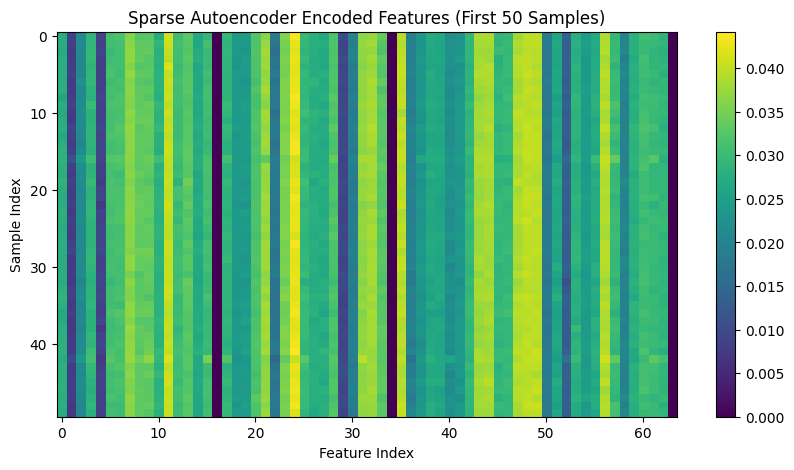

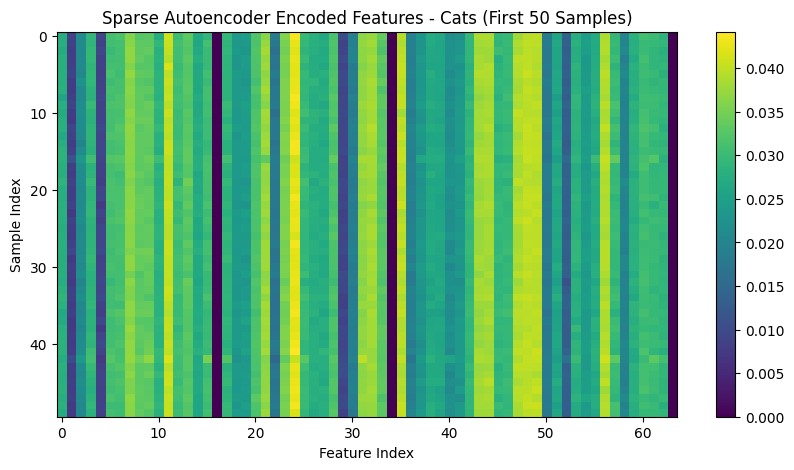

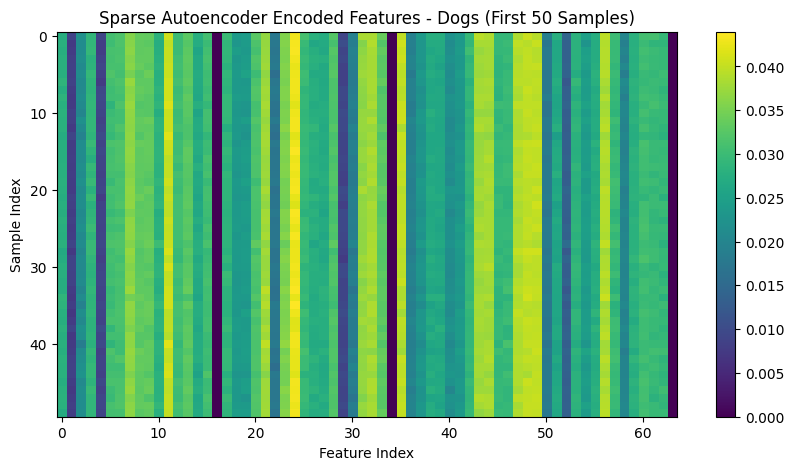

Encoded features (with file paths) saved to: /Users/ryan/Projects/XAI/myXAI/XAI_Assignment6/encoded_features_20250219_181916.csv
Top 5 images for each feature saved to: /Users/ryan/Projects/XAI/myXAI/XAI_Assignment6/feature_top_images_20250219_181916.txt


'\nGUIDE:\n\n1. Open the CSV file \'encoded_features_YYYYMMDD_HHMMSS.csv\'.\n   - Each row has: filepath, label (0=Cat, 1=Dog), and Feature_i columns.\n\n2. For each feature (column Feature_i), use the \'feature_top_images_YYYYMMDD_HHMMSS.txt\' file\n   to see which images strongly activate that feature. Look at the actual images on disk:\n   - For example, if Feature_5 strongly activates for images with cat whiskers or dog\'s ears, \n     you can guess that Feature_5 might be "whisker detection" or "ear detection".\n\n3. Provide ChatGPT with:\n   - A short description of each image (e.g., "cat with white fur" or "dog with floppy ears").\n   - The fact that these images are the top-activating examples for Feature_i.\n\n4. Ask ChatGPT: "Given these top-activating images, what might Feature_i be detecting?"\n\n5. Summarize ChatGPT\'s response in a dictionary or table, e.g.:\n   feature_descriptions = {\n       0: "Detects cat whiskers",\n       1: "Detects dog muzzle",\n       ...\n   }\

In [1]:
import os, datetime, torch, torchvision, kagglehub
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, random_split
from PIL import Image, ImageFile
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

################################################################################
# 1) CONFIGURATION
################################################################################
# Allows truncated images to load (helps with corrupt images)
ImageFile.LOAD_TRUNCATED_IMAGES = True

# Set whether to retrain or load existing models
RETRAIN_MODELS = True  
SAVE_DIR = "/Users/ryan/Projects/XAI/myXAI/XAI_Assignment6"
os.makedirs(SAVE_DIR, exist_ok=True)

# Choose device
device = "mps" if torch.backends.mps.is_available() else "cpu"
print("Using device:", device)

################################################################################
# 2) DOWNLOAD AND PREPARE DATA
################################################################################
dataset_path = kagglehub.dataset_download("shaunthesheep/microsoft-catsvsdogs-dataset")
# The dataset has subfolders: PetImages/Cat and PetImages/Dog
root_dir = os.path.join(dataset_path, "PetImages")

transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])

def is_valid(path):
    """Check if an image is valid/corrupt."""
    try:
        Image.open(path).verify()
        return True
    except Exception:
        return False

# Create a dataset from PetImages folder
dataset = torchvision.datasets.ImageFolder(root=root_dir, transform=transform)
# Filter out invalid images
dataset.samples = [s for s in dataset.samples if is_valid(s[0])]
print("Valid samples:", len(dataset.samples))
print("Classes (0=Cat, 1=Dog):", dataset.classes)

# Split dataset into train/validation
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Also create a "full_loader" to extract features from all images
full_loader = DataLoader(dataset, batch_size=32, shuffle=False)

################################################################################
# 3) DEFINE A SIMPLE CNN
################################################################################
class SimpleCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.relu = nn.ReLU()
        self.fc = nn.Linear(32 * 16 * 16, 2)  # 64x64 -> after two pools -> 16x16

    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = x.view(x.size(0), -1)
        return self.fc(x)

################################################################################
# 4) TRAIN OR LOAD CNN MODEL
################################################################################
cnn_model_path = None
if not RETRAIN_MODELS:
    # If not retraining, look for a previously saved model
    cnn_models = [f for f in os.listdir(SAVE_DIR) if "SimpleCNN" in f]
    if cnn_models:
        cnn_model_path = os.path.join(SAVE_DIR, sorted(cnn_models)[-1])

if RETRAIN_MODELS or cnn_model_path is None:
    model = SimpleCNN().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    print("Training CNN...")
    for epoch in range(5):
        model.train()
        epoch_loss = 0.0
        progress = tqdm(train_loader, desc=f"Epoch {epoch+1}/2")
        for imgs, labels in progress:
            imgs, labels = imgs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
            progress.set_postfix(loss=loss.item())
        print(f"Epoch {epoch+1} Loss: {epoch_loss/len(train_loader):.4f}")

    # Save CNN model with timestamp
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    cnn_model_path = os.path.join(SAVE_DIR, f"SimpleCNN_{timestamp}.pt")
    torch.save(model.state_dict(), cnn_model_path)
    print("Saved CNN model to:", cnn_model_path)
else:
    # Load the CNN model
    model = SimpleCNN().to(device)
    model.load_state_dict(torch.load(cnn_model_path, map_location=device))
    print("Loaded CNN model from:", cnn_model_path)

################################################################################
# 5) EVALUATE CNN ACCURACY ON VALIDATION SET
################################################################################
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for imgs, labels in val_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        total += labels.size(0)
        correct += (preds == labels).sum().item()

accuracy = correct / total
print(f"Validation Accuracy: {accuracy*100:.2f}%")

################################################################################
# 6) EXTRACT FEATURES ALONG WITH LABELS (LAST CONV LAYER)
################################################################################
def get_features_and_labels(net, loader):
    """
    Extract feature activations from the last conv layer along with their labels.
    For each batch:
      - Pass images through conv1 -> ReLU -> pool -> conv2 -> ReLU -> pool.
      - Flatten the output into a 1D vector per image.
      - Collect the corresponding labels.
    Returns:
      - features: tensor of shape (N, feature_dim)
      - labels: tensor of shape (N,)
      - paths: list of file paths (to identify images later)
    """
    features, all_labels, paths = [], [], []
    net.eval()
    with torch.no_grad():
        for imgs, labels in loader:
            x = imgs.to(device)
            x = net.pool(net.relu(net.conv1(x)))
            x = net.pool(net.relu(net.conv2(x)))
            features.append(x.cpu().view(x.size(0), -1))
            all_labels.append(labels)

            # The loader dataset is the original ImageFolder, which stores file paths in .samples
            # We can retrieve them by using the loader's dataset indices if needed,
            # but simpler is to just get them from the dataset's root. We'll do the index trick:
            # Note: loader.dataset is the entire dataset (the one we used to build 'full_loader')
            # But we must manually track the current indices in a typical scenario.
            # For simplicity, we'll rely on the fact that 'loader' is full_dataset in order.
            # So we can read from the dataset.samples in the same iteration order.
            # However, a robust approach is to store them outside or custom dataset.
            # We'll do a hack: we know how many images we've read so far by summing up the lengths of each batch.
        # Because we need the exact file paths, let's do a custom approach:
        # We'll ignore the above approach and do a second pass to read dataset.samples in the same order.

    # We'll do a second pass to get the same number of file paths in the same order:
    # Since 'loader' is not shuffled, we can directly iterate over the dataset again.
    # Or simpler: read the dataset.samples directly. We only do this if loader==full_loader.
    if len(loader.dataset.samples) == torch.cat(all_labels, dim=0).shape[0]:
        # The dataset is not shuffled, so we can match them one-to-one
        paths = [sample[0] for sample in loader.dataset.samples]
    else:
        # Fallback: If there's any mismatch, we won't track paths accurately
        paths = ["unknown"] * torch.cat(all_labels, dim=0).shape[0]

    return torch.cat(features, dim=0), torch.cat(all_labels, dim=0), paths

feature_maps, feature_labels, file_paths = get_features_and_labels(model, full_loader)
print("Feature maps shape:", feature_maps.shape)
print("Feature labels shape:", feature_labels.shape)
print("Example path:", file_paths[0] if file_paths else "No paths found")

unique, counts = np.unique(feature_labels.numpy(), return_counts=True)
print("Label distribution (0=Cat, 1=Dog):", dict(zip(unique, counts)))

################################################################################
# 7) SPARSE AUTOENCODER (SAE)
################################################################################
class SparseAutoencoder(nn.Module):
    def __init__(self, input_dim, hidden_dim=64):
        super().__init__()
        self.encoder = nn.Linear(input_dim, hidden_dim)
        self.decoder = nn.Linear(hidden_dim, input_dim)
        self.relu = nn.ReLU()

    def forward(self, x):
        encoded = self.relu(self.encoder(x))
        decoded = self.decoder(encoded)
        return decoded, encoded

sae_model_path = None
if not RETRAIN_MODELS:
    sae_models = [f for f in os.listdir(SAVE_DIR) if "SparseAutoencoder" in f]
    if sae_models:
        sae_model_path = os.path.join(SAVE_DIR, sorted(sae_models)[-1])

def l1_regularization(module, factor=1e-4):
    return factor * torch.sum(torch.abs(module.encoder.weight))

if RETRAIN_MODELS or sae_model_path is None:
    sae = SparseAutoencoder(feature_maps.shape[1]).to(device)
    optimizer_sae = optim.Adam(sae.parameters(), lr=1e-3)
    mse_loss = nn.MSELoss()

    feature_maps = feature_maps.to(device)
    print("Training Sparse Autoencoder...")
    for epoch in range(5):
        sae.train()
        epoch_loss = 0.0
        progress = tqdm(range(0, feature_maps.size(0), 32), desc=f"SAE Epoch {epoch+1}/2")
        for i in progress:
            batch = feature_maps[i:i+32]
            optimizer_sae.zero_grad()
            decoded, encoded = sae(batch)
            loss = mse_loss(decoded, batch) + l1_regularization(sae)
            loss.backward()
            optimizer_sae.step()
            epoch_loss += loss.item()
            progress.set_postfix(loss=loss.item())
        print(f"SAE Epoch {epoch+1} Loss: {epoch_loss/(((feature_maps.size(0)-1)//32)+1):.4f}")

    # Save SAE model
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    sae_model_path = os.path.join(SAVE_DIR, f"SparseAutoencoder_{timestamp}.pt")
    torch.save(sae.state_dict(), sae_model_path)
    print("Saved SAE model to:", sae_model_path)
else:
    sae = SparseAutoencoder(feature_maps.shape[1]).to(device)
    sae.load_state_dict(torch.load(sae_model_path, map_location=device))
    print("Loaded SAE model from:", sae_model_path)

################################################################################
# 8) VISUALIZE AND INTERPRET SPARSE FEATURES
################################################################################
feature_maps = feature_maps.to(device)
sae.eval()
with torch.no_grad():
    decoded_features, encoded_features = sae(feature_maps)

encoded_np = encoded_features.cpu().numpy()
labels_np = feature_labels.cpu().numpy()

# Separate activations for cats (label 0) and dogs (label 1)
cats_encoded = encoded_np[labels_np == 0]
dogs_encoded = encoded_np[labels_np == 1]

def plot_heatmap(data, title):
    plt.figure(figsize=(10, 5))
    num_samples = min(50, data.shape[0])
    plt.imshow(np.abs(data[:num_samples]), aspect='auto', cmap='viridis')
    plt.colorbar()
    plt.title(title)
    plt.xlabel("Feature Index")
    plt.ylabel("Sample Index")
    plt.show()

# 8.1) Plot heatmaps
plot_heatmap(encoded_np, "Sparse Autoencoder Encoded Features (First 50 Samples)")

if cats_encoded.shape[0] > 0:
    plot_heatmap(cats_encoded, "Sparse Autoencoder Encoded Features - Cats (First 50 Samples)")
else:
    print("No cat samples found in the features.")

if dogs_encoded.shape[0] > 0:
    plot_heatmap(dogs_encoded, "Sparse Autoencoder Encoded Features - Dogs (First 50 Samples)")
else:
    print("No dog samples found in the features.")

################################################################################
# 9) SAVE ENCODED FEATURES + IMAGE PATHS FOR MANUAL INSPECTION
################################################################################
# We'll create a DataFrame with columns: [filepath, label, Feature_0, Feature_1, ...]
df_dict = {
    "filepath": file_paths,
    "label": labels_np
}
for i in range(encoded_np.shape[1]):
    df_dict[f"Feature_{i}"] = encoded_np[:, i]

encoded_df = pd.DataFrame(df_dict)
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
csv_path = os.path.join(SAVE_DIR, f"encoded_features_{timestamp}.csv")
encoded_df.to_csv(csv_path, index=False)
print("Encoded features (with file paths) saved to:", csv_path)

################################################################################
# 10) MATCH FEATURE ACTIVATIONS WITH DESCRIPTIONS
################################################################################
# APPROACH: Identify top-N images for each feature, so you can inspect them manually or via ChatGPT.

def find_top_images_for_feature(encoded_data, file_paths, feature_idx, top_n=5):
    """
    Returns indices (and file paths) of the top-N images for a given feature index.
    """
    # Sort by descending activation
    sorted_indices = np.argsort(-encoded_data[:, feature_idx])  
    top_indices = sorted_indices[:top_n]
    return top_indices

top_n = 5  # How many top images per feature to inspect
num_features = encoded_np.shape[1]
feature_top_images = {}

for feature_idx in range(num_features):
    top_indices = find_top_images_for_feature(encoded_np, file_paths, feature_idx, top_n=top_n)
    feature_top_images[feature_idx] = [file_paths[i] for i in top_indices]

# Print or save a summary of top images per feature
summary_path = os.path.join(SAVE_DIR, f"feature_top_images_{timestamp}.txt")
with open(summary_path, "w") as f:
    for feature_idx, paths in feature_top_images.items():
        f.write(f"Feature {feature_idx} - Top {top_n} images:\n")
        for p in paths:
            f.write(f"   {p}\n")
        f.write("\n")

print(f"Top {top_n} images for each feature saved to: {summary_path}")

################################################################################
# 11) HOW TO USE CHATGPT FOR LABEL GENERATION
################################################################################
"""
GUIDE:

1. Open the CSV file 'encoded_features_YYYYMMDD_HHMMSS.csv'.
   - Each row has: filepath, label (0=Cat, 1=Dog), and Feature_i columns.

2. For each feature (column Feature_i), use the 'feature_top_images_YYYYMMDD_HHMMSS.txt' file
   to see which images strongly activate that feature. Look at the actual images on disk:
   - For example, if Feature_5 strongly activates for images with cat whiskers or dog's ears, 
     you can guess that Feature_5 might be "whisker detection" or "ear detection".

3. Provide ChatGPT with:
   - A short description of each image (e.g., "cat with white fur" or "dog with floppy ears").
   - The fact that these images are the top-activating examples for Feature_i.

4. Ask ChatGPT: "Given these top-activating images, what might Feature_i be detecting?"

5. Summarize ChatGPT's response in a dictionary or table, e.g.:
   feature_descriptions = {
       0: "Detects cat whiskers",
       1: "Detects dog muzzle",
       ...
   }

This approach helps you systematically interpret the learned features in the sparse autoencoder.
"""

In [2]:
import kagglehub

dataset_path = kagglehub.dataset_download("shaunthesheep/microsoft-catsvsdogs-dataset")
print("Dataset downloaded to:", dataset_path)


Dataset downloaded to: /Users/ryan/.cache/kagglehub/datasets/shaunthesheep/microsoft-catsvsdogs-dataset/versions/1


In [3]:
print("Classes:", dataset.classes)  
# Expect: ['Cat', 'Dog']

Classes: ['Cat', 'Dog']


In [4]:
print("Label distribution in dataset:", np.unique(labels_np, return_counts=True))

Label distribution in dataset: (array([0, 1]), array([12499, 12499]))


In [5]:
print("Encoded feature shape:", encoded_np.shape)  # Should be (24998, hidden_dim)
print("Cats encoded shape:", cats_encoded.shape)  # Should be (~12499, hidden_dim)
print("Dogs encoded shape:", dogs_encoded.shape)  # Should be (~12499, hidden_dim)

Encoded feature shape: (24998, 64)
Cats encoded shape: (12499, 64)
Dogs encoded shape: (12499, 64)


In [6]:
cat_mean = np.mean(cats_encoded, axis=0)
dog_mean = np.mean(dogs_encoded, axis=0)

print("Mean feature activation (cats):", cat_mean[:10])  # Print first 10 features
print("Mean feature activation (dogs):", dog_mean[:10])  # Print first 10 features

Mean feature activation (cats): [0.02787467 0.00818438 0.02121059 0.02883649 0.00901604 0.03082009
 0.03126474 0.03630073 0.03335039 0.03332265]
Mean feature activation (dogs): [0.02783599 0.00820463 0.02120427 0.02892135 0.00900438 0.03070774
 0.03120776 0.0363558  0.03313757 0.03322631]


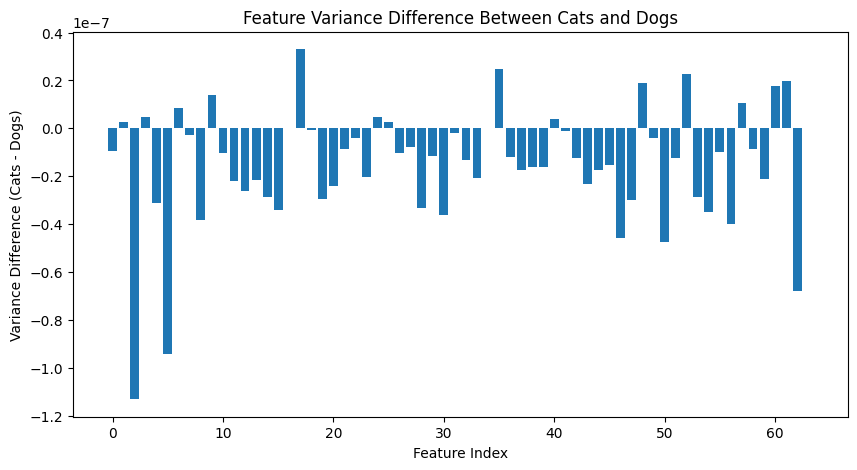

In [7]:
import matplotlib.pyplot as plt

feature_variance = np.var(cats_encoded, axis=0) - np.var(dogs_encoded, axis=0)
plt.figure(figsize=(10, 5))
plt.bar(range(len(feature_variance)), feature_variance)
plt.xlabel("Feature Index")
plt.ylabel("Variance Difference (Cats - Dogs)")
plt.title("Feature Variance Difference Between Cats and Dogs")
plt.show()

Using device: mps
Valid samples: 24998
Classes: ['Cat', 'Dog']
Training DeeperCNN...


CNN Epoch 1/5: 100%|██████████████████████████| 625/625 [00:31<00:00, 20.04it/s]


Epoch 1 - Loss: 0.6263


CNN Epoch 2/5: 100%|██████████████████████████| 625/625 [00:30<00:00, 20.51it/s]


Epoch 2 - Loss: 0.5391


CNN Epoch 3/5: 100%|██████████████████████████| 625/625 [00:30<00:00, 20.54it/s]


Epoch 3 - Loss: 0.4845


CNN Epoch 4/5: 100%|██████████████████████████| 625/625 [00:30<00:00, 20.36it/s]


Epoch 4 - Loss: 0.4459


CNN Epoch 5/5: 100%|██████████████████████████| 625/625 [00:30<00:00, 20.27it/s]


Epoch 5 - Loss: 0.4186
Saved DeeperCNN model to: /Users/ryan/Projects/XAI/myXAI/XAI_Assignment6/DeeperCNN_20250219_183816.pt
Validation Accuracy: 78.98%
Feature shape: torch.Size([24998, 4096])
Labels shape: torch.Size([24998])
Label distribution (0=Cat, 1=Dog): {np.int64(0): np.int64(12499), np.int64(1): np.int64(12499)}
Training Sparse Autoencoder...
SAE Epoch 1/10, Loss: 4.1256
SAE Epoch 2/10, Loss: 3.6338
SAE Epoch 3/10, Loss: 3.1743
SAE Epoch 4/10, Loss: 2.7518
SAE Epoch 5/10, Loss: 2.3714
SAE Epoch 6/10, Loss: 2.0253
SAE Epoch 7/10, Loss: 1.7160
SAE Epoch 8/10, Loss: 1.4448
SAE Epoch 9/10, Loss: 1.2092
SAE Epoch 10/10, Loss: 1.0116
Saved SAE model to: /Users/ryan/Projects/XAI/myXAI/XAI_Assignment6/SparseAutoencoder_20250219_183917.pt


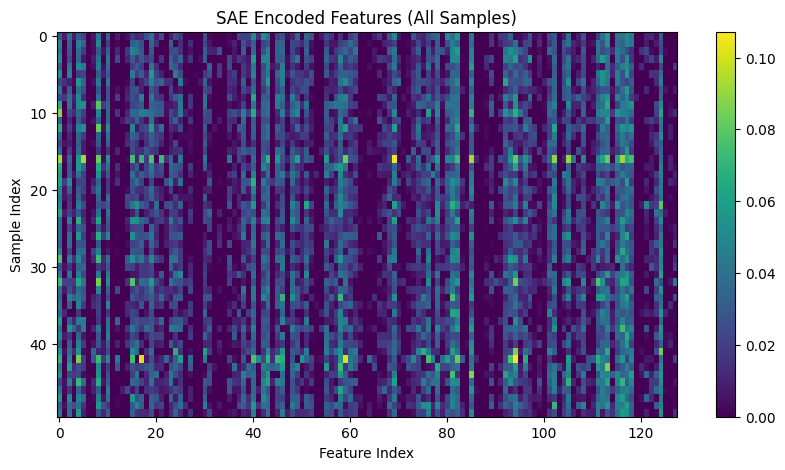

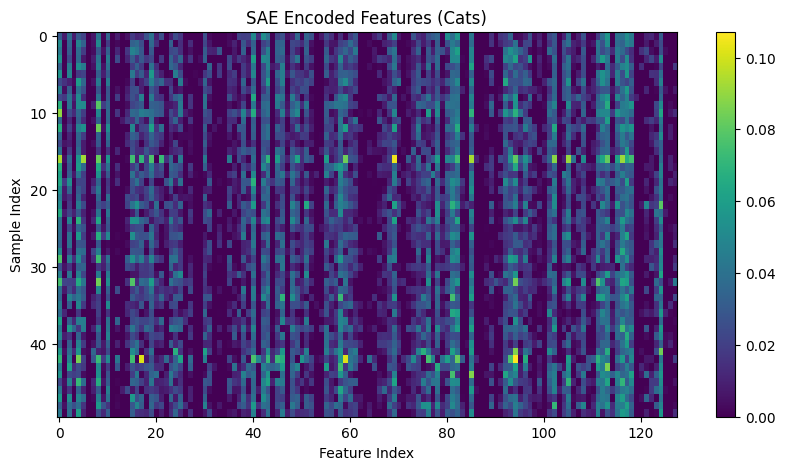

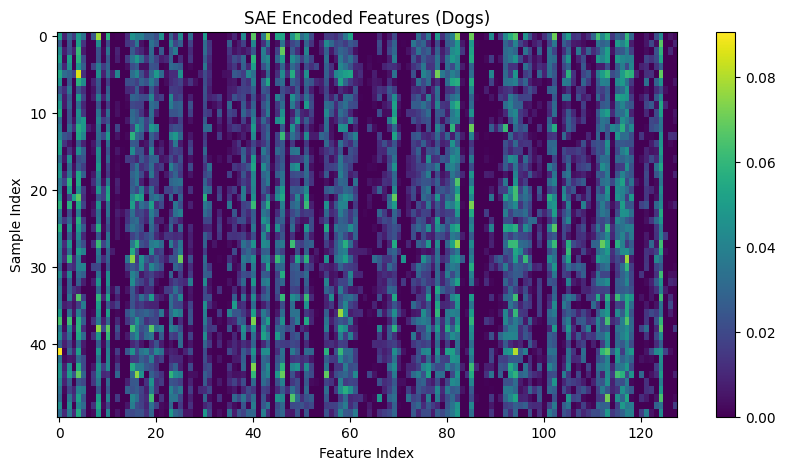

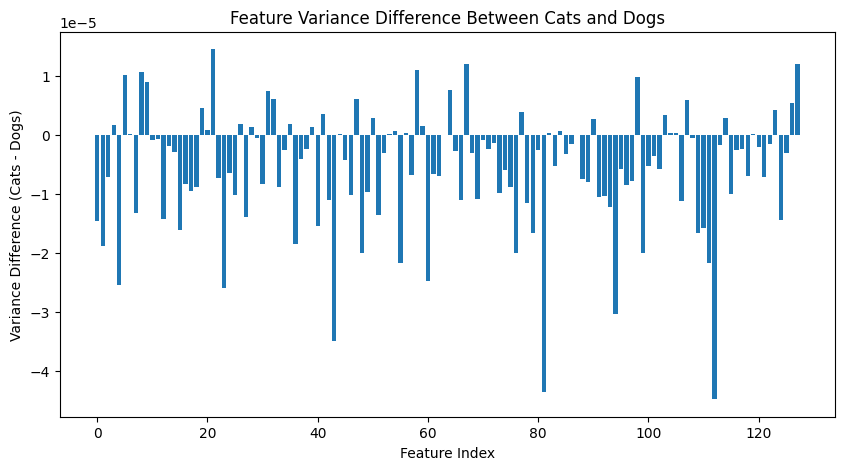

Feature 0: Top 5 images:
    /Users/ryan/.cache/kagglehub/datasets/shaunthesheep/microsoft-catsvsdogs-dataset/versions/1/PetImages/Cat/4538.jpg
    /Users/ryan/.cache/kagglehub/datasets/shaunthesheep/microsoft-catsvsdogs-dataset/versions/1/PetImages/Dog/3168.jpg
    /Users/ryan/.cache/kagglehub/datasets/shaunthesheep/microsoft-catsvsdogs-dataset/versions/1/PetImages/Dog/10190.jpg
    /Users/ryan/.cache/kagglehub/datasets/shaunthesheep/microsoft-catsvsdogs-dataset/versions/1/PetImages/Dog/10161.jpg
    /Users/ryan/.cache/kagglehub/datasets/shaunthesheep/microsoft-catsvsdogs-dataset/versions/1/PetImages/Cat/7573.jpg

Feature 1: Top 5 images:
    /Users/ryan/.cache/kagglehub/datasets/shaunthesheep/microsoft-catsvsdogs-dataset/versions/1/PetImages/Dog/11121.jpg
    /Users/ryan/.cache/kagglehub/datasets/shaunthesheep/microsoft-catsvsdogs-dataset/versions/1/PetImages/Cat/10429.jpg
    /Users/ryan/.cache/kagglehub/datasets/shaunthesheep/microsoft-catsvsdogs-dataset/versions/1/PetImages/Dog/11

In [8]:
import os
import datetime
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import kagglehub
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, random_split
from PIL import Image, ImageFile
import matplotlib.pyplot as plt
from tqdm import tqdm

################################################################################
# 1) CONFIGURATION
################################################################################

# Allow truncated images to load (helps with corrupt images)
ImageFile.LOAD_TRUNCATED_IMAGES = True

# If True, retrains both the CNN and the SAE; if False, attempts to load saved models
RETRAIN_MODELS = True  

# Directory to save models, CSVs, etc.
SAVE_DIR = "/Users/ryan/Projects/XAI/myXAI/XAI_Assignment6"
os.makedirs(SAVE_DIR, exist_ok=True)

# Choose device
device = "mps" if torch.backends.mps.is_available() else "cpu"
print("Using device:", device)

################################################################################
# 2) DOWNLOAD AND PREPARE DATA
################################################################################

# Download dataset (Kaggle Cats vs Dogs)
dataset_path = kagglehub.dataset_download("shaunthesheep/microsoft-catsvsdogs-dataset")
root_dir = os.path.join(dataset_path, "PetImages")  # folder containing Cat/ and Dog/

# Define transforms
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])

# Create ImageFolder dataset
dataset = torchvision.datasets.ImageFolder(root=root_dir, transform=transform)

# Filter out any invalid/corrupt images
def is_valid(path):
    try:
        Image.open(path).verify()
        return True
    except Exception:
        return False

dataset.samples = [s for s in dataset.samples if is_valid(s[0])]
print("Valid samples:", len(dataset.samples))
print("Classes:", dataset.classes)  # Expect ['Cat', 'Dog']

# Split dataset into train/validation
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Full loader for extracting features from the entire dataset
full_loader = DataLoader(dataset, batch_size=32, shuffle=False)

################################################################################
# 3) DEFINE A DEEPER CNN
################################################################################

class DeeperCNN(nn.Module):
    def __init__(self):
        super().__init__()
        # Three convolution layers
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.relu = nn.ReLU()
        # After 3 poolings on 64x64 -> 8x8, with 64 channels => 64*8*8=4096
        self.fc = nn.Linear(64*8*8, 2)

    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))  # -> 32x32
        x = self.pool(self.relu(self.conv2(x)))  # -> 16x16
        x = self.pool(self.relu(self.conv3(x)))  # -> 8x8
        x = x.view(x.size(0), -1)
        return self.fc(x)

################################################################################
# 4) TRAIN OR LOAD CNN
################################################################################

cnn_model_path = None
if not RETRAIN_MODELS:
    # If not retraining, try loading a saved CNN
    cnn_models = [f for f in os.listdir(SAVE_DIR) if "DeeperCNN" in f]
    if cnn_models:
        cnn_model_path = os.path.join(SAVE_DIR, sorted(cnn_models)[-1])

model = DeeperCNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

if RETRAIN_MODELS or cnn_model_path is None:
    print("Training DeeperCNN...")
    num_cnn_epochs = 5
    for epoch in range(num_cnn_epochs):
        model.train()
        running_loss = 0.0
        for imgs, labels in tqdm(train_loader, desc=f"CNN Epoch {epoch+1}/{num_cnn_epochs}"):
            imgs, labels = imgs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        avg_loss = running_loss / len(train_loader)
        print(f"Epoch {epoch+1} - Loss: {avg_loss:.4f}")

    # Save CNN
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    cnn_model_path = os.path.join(SAVE_DIR, f"DeeperCNN_{timestamp}.pt")
    torch.save(model.state_dict(), cnn_model_path)
    print("Saved DeeperCNN model to:", cnn_model_path)
else:
    # Load existing model
    model.load_state_dict(torch.load(cnn_model_path, map_location=device))
    print("Loaded DeeperCNN model from:", cnn_model_path)

################################################################################
# 5) EVALUATE CNN ACCURACY
################################################################################

model.eval()
correct = 0
total = 0
with torch.no_grad():
    for imgs, labels in val_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        total += labels.size(0)
        correct += (preds == labels).sum().item()

accuracy = correct / total
print(f"Validation Accuracy: {accuracy*100:.2f}%")

################################################################################
# 6) EXTRACT FEATURES (LAST CONV LAYER) + LABELS + FILE PATHS
################################################################################

def get_features_and_labels(net, loader):
    """
    Pass images through conv1->conv2->conv3 with ReLU & Pool,
    flatten, and collect labels + file paths.
    Returns: (features, labels, file_paths)
    """
    features, all_labels = [], []
    file_paths = []

    net.eval()
    idx = 0
    with torch.no_grad():
        for imgs, labels in loader:
            x = imgs.to(device)
            x = net.pool(net.relu(net.conv1(x)))
            x = net.pool(net.relu(net.conv2(x)))
            x = net.pool(net.relu(net.conv3(x)))
            feats = x.view(x.size(0), -1).cpu()

            features.append(feats)
            all_labels.append(labels)

    # We do a second pass for file_paths in dataset.samples 
    # (since loader is not necessarily in the same order as .samples).
    # But if loader is unshuffled, it might match. Let's assume no shuffle for full_loader.
    # For a robust approach, we might store them differently, but let's do a simple approach:
    if len(loader.dataset.samples) == sum(batch[0].shape[0] for batch in loader):
        # The number of images in the loader matches the dataset
        # So we can read them in order from dataset.samples
        file_paths = [sample[0] for sample in loader.dataset.samples]
    else:
        # Fallback if there's mismatch
        file_paths = ["unknown"] * torch.cat(all_labels, dim=0).shape[0]

    return torch.cat(features, dim=0), torch.cat(all_labels, dim=0), file_paths

features, labels_tensor, file_paths = get_features_and_labels(model, full_loader)
print("Feature shape:", features.shape)
print("Labels shape:", labels_tensor.shape)

# Check distribution
unique, counts = np.unique(labels_tensor.numpy(), return_counts=True)
print("Label distribution (0=Cat, 1=Dog):", dict(zip(unique, counts)))

################################################################################
# 7) TRAIN OR LOAD SPARSE AUTOENCODER
################################################################################

class SparseAutoencoder(nn.Module):
    def __init__(self, input_dim, hidden_dim=128):
        super().__init__()
        self.encoder = nn.Linear(input_dim, hidden_dim)
        self.decoder = nn.Linear(hidden_dim, input_dim)
        self.relu = nn.ReLU()

    def forward(self, x):
        encoded = self.relu(self.encoder(x))
        decoded = self.decoder(encoded)
        return decoded, encoded

def l1_regularization(module, factor=1e-3):
    return factor * torch.sum(torch.abs(module.encoder.weight))

sae_model_path = None
if not RETRAIN_MODELS:
    sae_models = [f for f in os.listdir(SAVE_DIR) if "SparseAutoencoder" in f]
    if sae_models:
        sae_model_path = os.path.join(SAVE_DIR, sorted(sae_models)[-1])

sae = SparseAutoencoder(features.shape[1], hidden_dim=128).to(device)
optimizer_sae = optim.Adam(sae.parameters(), lr=1e-3)
mse_loss = nn.MSELoss()

if RETRAIN_MODELS or sae_model_path is None:
    print("Training Sparse Autoencoder...")
    num_sae_epochs = 10
    features = features.to(device)
    for epoch in range(num_sae_epochs):
        sae.train()
        optimizer_sae.zero_grad()
        decoded, encoded = sae(features)
        loss = mse_loss(decoded, features) + l1_regularization(sae, factor=1e-3)
        loss.backward()
        optimizer_sae.step()
        print(f"SAE Epoch {epoch+1}/{num_sae_epochs}, Loss: {loss.item():.4f}")

    # Save SAE
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    sae_model_path = os.path.join(SAVE_DIR, f"SparseAutoencoder_{timestamp}.pt")
    torch.save(sae.state_dict(), sae_model_path)
    print("Saved SAE model to:", sae_model_path)
else:
    sae.load_state_dict(torch.load(sae_model_path, map_location=device))
    print("Loaded SAE model from:", sae_model_path)

################################################################################
# 8) VISUALIZE & INSPECT FEATURES
################################################################################
# Move features back to device if needed
features = features.to(device)
sae.eval()
with torch.no_grad():
    decoded, encoded = sae(features)

encoded_np = encoded.cpu().numpy()
labels_np = labels_tensor.numpy()

# Separate cats/dogs
cats_encoded = encoded_np[labels_np == 0]
dogs_encoded = encoded_np[labels_np == 1]

def plot_heatmap(data, title):
    plt.figure(figsize=(10, 5))
    num_samples = min(50, data.shape[0])
    plt.imshow(np.abs(data[:num_samples]), aspect='auto', cmap='viridis')
    plt.colorbar()
    plt.title(title)
    plt.xlabel("Feature Index")
    plt.ylabel("Sample Index")
    plt.show()

# Plot "All" heatmap
plot_heatmap(encoded_np, "SAE Encoded Features (All Samples)")

# Plot cats
if len(cats_encoded) > 0:
    plot_heatmap(cats_encoded, "SAE Encoded Features (Cats)")
else:
    print("No cat samples found.")

# Plot dogs
if len(dogs_encoded) > 0:
    plot_heatmap(dogs_encoded, "SAE Encoded Features (Dogs)")
else:
    print("No dog samples found.")

################################################################################
# 9) FEATURE VARIANCE DIFFERENCE BETWEEN CATS & DOGS
################################################################################
cat_var = np.var(cats_encoded, axis=0)
dog_var = np.var(dogs_encoded, axis=0)
var_diff = cat_var - dog_var

plt.figure(figsize=(10, 5))
plt.bar(range(len(var_diff)), var_diff)
plt.title("Feature Variance Difference Between Cats and Dogs")
plt.xlabel("Feature Index")
plt.ylabel("Variance Difference (Cats - Dogs)")
plt.show()

################################################################################
# 10) TOP IMAGES FOR EACH FEATURE
################################################################################
def find_top_images_for_feature(encoded_data, file_paths, feature_idx, top_n=5):
    """
    Returns the top-N file paths with highest activation for a given feature.
    """
    # Sort by descending activation
    sorted_indices = np.argsort(-encoded_data[:, feature_idx])
    top_indices = sorted_indices[:top_n]
    return [file_paths[i] for i in top_indices]

top_n = 5
num_features = encoded_np.shape[1]
feature_top_images = {}

for f_idx in range(num_features):
    feature_top_images[f_idx] = find_top_images_for_feature(encoded_np, file_paths, f_idx, top_n)

# Print out top images per feature (for manual inspection)
for f_idx, paths in feature_top_images.items():
    print(f"Feature {f_idx}: Top {top_n} images:")
    for p in paths:
        print("   ", p)
    print()

################################################################################
# 11) SAVE RESULTS TO CSV
################################################################################
# Create a DataFrame with [filepath, label, Feature_0, Feature_1, ...]
df_dict = {
    "filepath": file_paths,
    "label": labels_np
}
for i in range(encoded_np.shape[1]):
    df_dict[f"Feature_{i}"] = encoded_np[:, i]

encoded_df = pd.DataFrame(df_dict)
csv_name = f"encoded_features_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}.csv"
csv_path = os.path.join(SAVE_DIR, csv_name)
encoded_df.to_csv(csv_path, index=False)
print("Encoded features saved to:", csv_path)

################################################################################
# HOW TO USE THESE RESULTS WITH CHATGPT
################################################################################
"""
1. Check the 'feature_top_images.txt' approach (or the printed console output) to see which
   images strongly activate a certain feature. Manually inspect those images to see
   what they have in common (e.g., dog ears, cat whiskers, color patterns, etc.).

2. You can provide ChatGPT with:
   - The CSV file with feature activations
   - Descriptions of the top-N images for each feature
   And ask ChatGPT: "Based on these images, what might Feature X be detecting?"

3. Summarize ChatGPT's responses in a dictionary, e.g.:
   feature_descriptions = {
       0: "Bright background detection",
       1: "Furry texture detection",
       ...
   }
4. Combine these insights with the variance difference plot to see which features
   differ most between cats and dogs.
"""

print("All steps completed!")

Using device: mps
Valid samples: 24998
Classes: ['Cat', 'Dog']
Loaded DeeperCNN from: /Users/ryan/Projects/XAI/myXAI/XAI_Assignment6/DeeperCNN_20250219_183816.pt


/var/folders/7b/3z6d319x6yx7scj5rrm1jx6w0000gn/T/ipykernel_65190/1013457606.py:119: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(cnn_model_

Validation Accuracy: 80.32%


Extracting conv3 activations: 100%|███████████| 782/782 [00:29<00:00, 26.86it/s]


Conv3 feature shape: torch.Size([24998, 64])
Label distribution: {np.int64(0): np.int64(12499), np.int64(1): np.int64(12499)}
Top 10 channels for Cats: [54 48 55 36 58 10 61 40 53  8]
Top 10 channels for Dogs: [54 48 55 58 36 61 10 40 26 53]

Processing top channels for Cats:


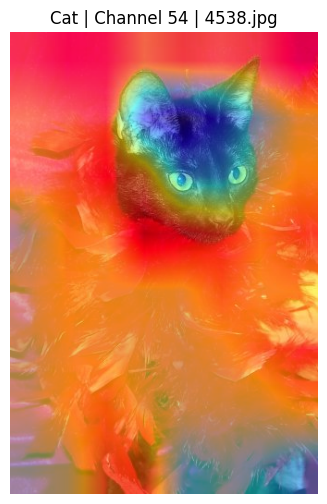

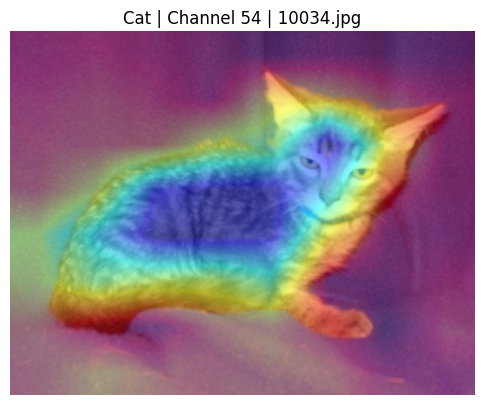

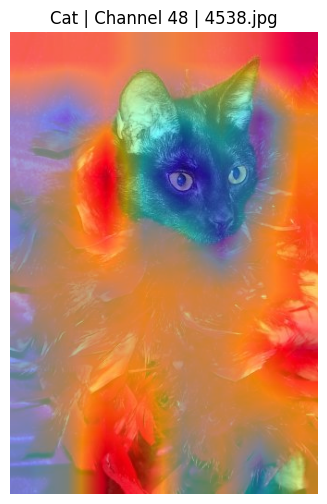

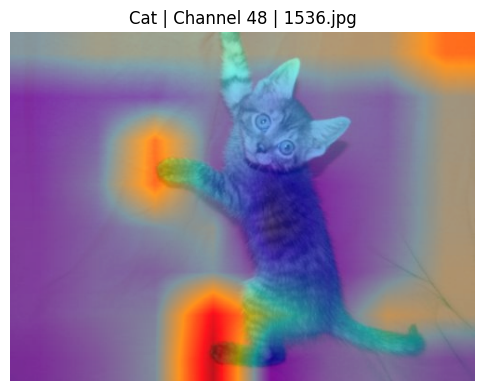

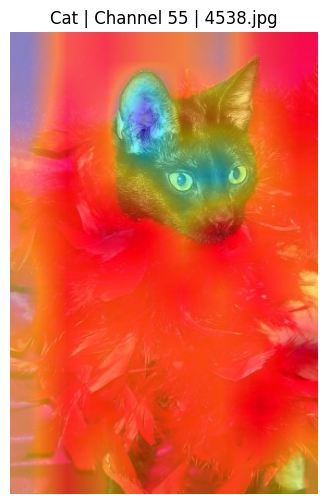

...

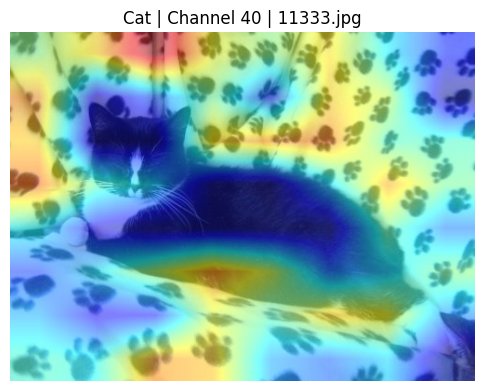

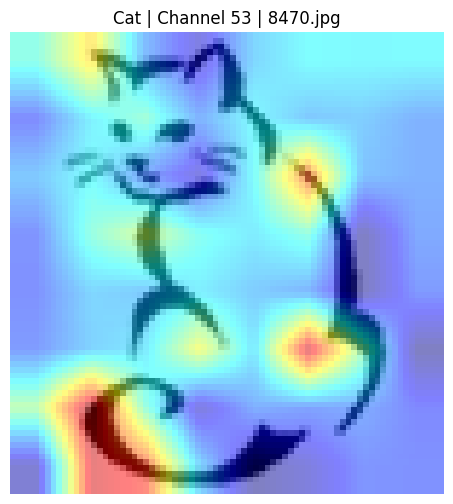

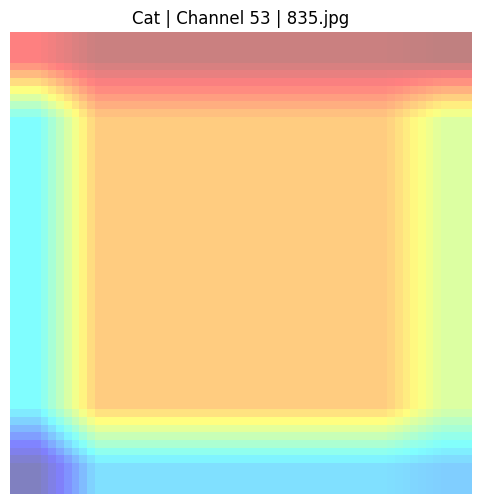

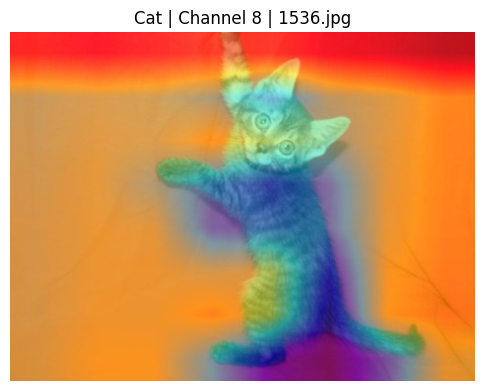

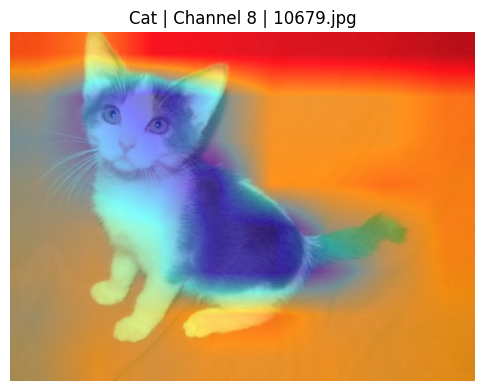


Processing top channels for Dogs:


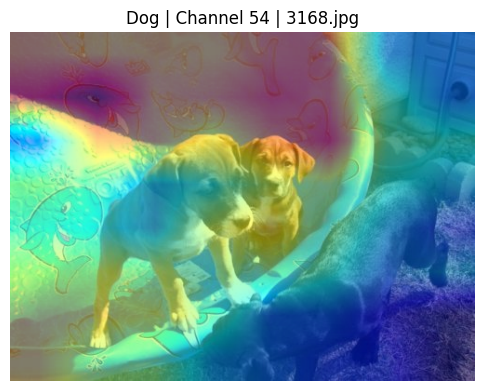

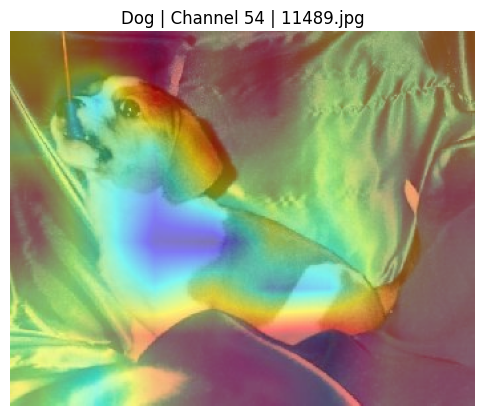

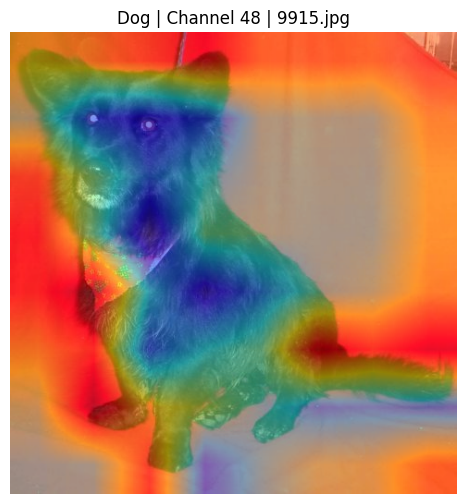

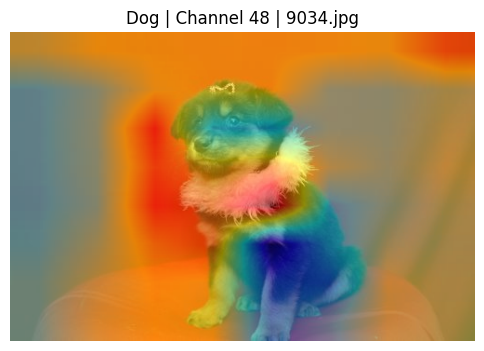

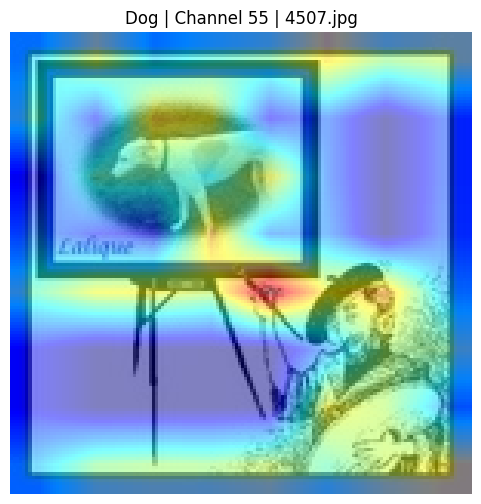

...

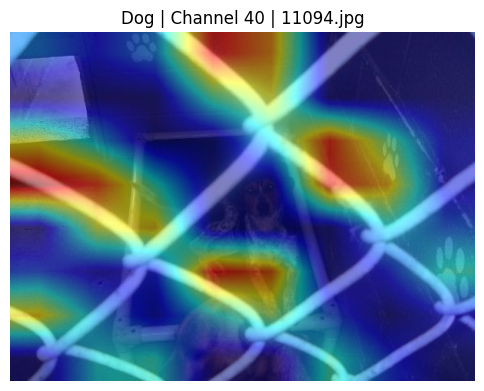

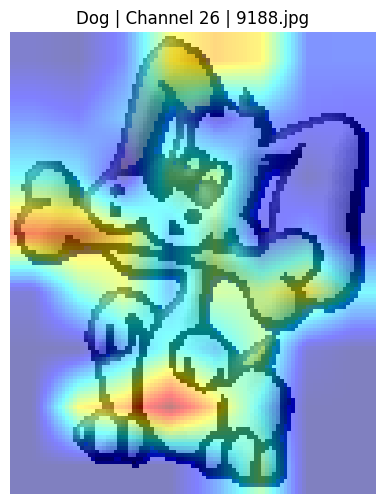

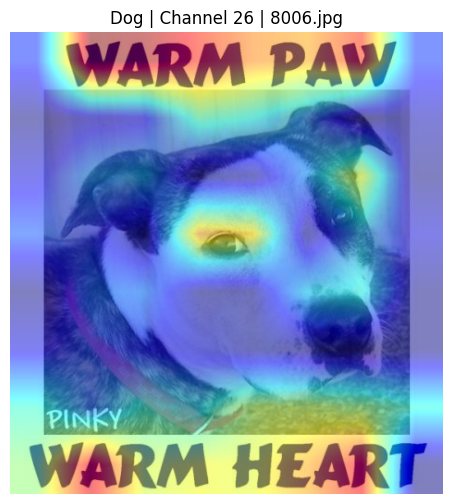

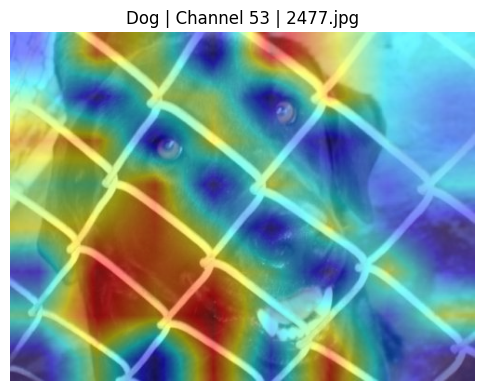

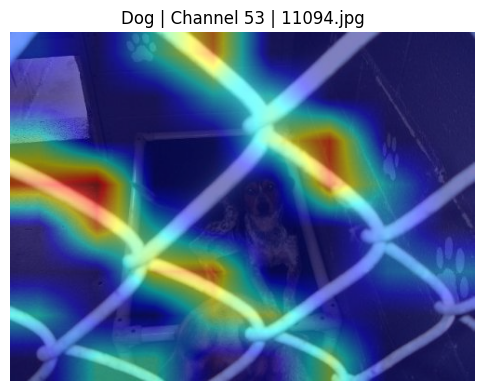

In [12]:
import os, datetime, numpy as np, pandas as pd, torch, torchvision, kagglehub
import torch.nn as nn, torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, random_split
from PIL import Image, ImageFile
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch.nn.functional as F

# Allow truncated images to load (helps with corrupt images)
ImageFile.LOAD_TRUNCATED_IMAGES = True

################################################################################
# CONFIGURATION
################################################################################
RETRAIN_MODELS = False# Set True to retrain; False to load saved models
SAVE_DIR = "/Users/ryan/Projects/XAI/myXAI/XAI_Assignment6"
os.makedirs(SAVE_DIR, exist_ok=True)
device = "mps" if torch.backends.mps.is_available() else "cpu"
print("Using device:", device)

################################################################################
# 1) DOWNLOAD AND PREPARE DATA
################################################################################
dataset_path = kagglehub.dataset_download("shaunthesheep/microsoft-catsvsdogs-dataset")
# The dataset has a folder "PetImages" with two subfolders: "Cat" and "Dog"
root_dir = os.path.join(dataset_path, "PetImages")

transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])
dataset = torchvision.datasets.ImageFolder(root=root_dir, transform=transform)

# Filter out invalid images
def is_valid(path):
    try:
        Image.open(path).verify()
        return True
    except Exception:
        return False

dataset.samples = [s for s in dataset.samples if is_valid(s[0])]
print("Valid samples:", len(dataset.samples))
print("Classes:", dataset.classes)  # Expect ['Cat', 'Dog']

# Split into train and validation (80/20)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=32, shuffle=False)
# Full loader (no shuffle) for later per-image feature extraction
full_loader  = DataLoader(dataset, batch_size=32, shuffle=False)

################################################################################
# 2) DEFINE A DEEPER CNN (with 3 conv layers)
################################################################################
class DeeperCNN(nn.Module):
    def __init__(self):
        super().__init__()
        # Three conv layers
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
        self.pool  = nn.MaxPool2d(2,2)
        self.relu  = nn.ReLU()
        # After 3 poolings on 64x64, spatial dims become 8x8
        self.fc = nn.Linear(64*8*8, 2)

    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))  # 64 -> 32
        x = self.pool(self.relu(self.conv2(x)))  # 32 -> 16
        x = self.pool(self.relu(self.conv3(x)))  # 16 -> 8
        x = x.view(x.size(0), -1)
        return self.fc(x)
    
    # Helper: return conv3 activations (before flattening)
    def get_conv3(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.pool(self.relu(self.conv3(x)))  # shape: (B,64,8,8)
        return x

################################################################################
# 3) TRAIN OR LOAD THE DEEPER CNN
################################################################################
cnn_model_path = None
if not RETRAIN_MODELS:
    cnn_models = [f for f in os.listdir(SAVE_DIR) if "DeeperCNN" in f]
    if cnn_models:
        cnn_model_path = os.path.join(SAVE_DIR, sorted(cnn_models)[-1])
        
model = DeeperCNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

if RETRAIN_MODELS or cnn_model_path is None:
    print("Training DeeperCNN...")
    num_cnn_epochs = 5
    for epoch in range(num_cnn_epochs):
        model.train()
        running_loss = 0.0
        for imgs, labels in tqdm(train_loader, desc=f"CNN Epoch {epoch+1}/{num_cnn_epochs}"):
            imgs, labels = imgs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        avg_loss = running_loss/len(train_loader)
        print(f"Epoch {epoch+1} Loss: {avg_loss:.4f}")
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    cnn_model_path = os.path.join(SAVE_DIR, f"DeeperCNN_{timestamp}.pt")
    torch.save(model.state_dict(), cnn_model_path)
    print("Saved DeeperCNN to:", cnn_model_path)
else:
    model.load_state_dict(torch.load(cnn_model_path, map_location=device))
    print("Loaded DeeperCNN from:", cnn_model_path)

################################################################################
# 4) EVALUATE CNN ACCURACY
################################################################################
model.eval()
correct, total = 0, 0
with torch.no_grad():
    for imgs, labels in val_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        total += labels.size(0)
        correct += (preds==labels).sum().item()
accuracy = correct/total
print(f"Validation Accuracy: {accuracy*100:.2f}%")

################################################################################
# 5) EXTRACT CONV3 ACTIVATIONS (for each image) & AVERAGE PER-CHANNEL FEATURES
################################################################################
# We will compute conv3 activations for each image in full_loader
# and average spatially to obtain a (N, 64) matrix.
all_conv3 = []
all_labels = []
all_file_paths = []  # from dataset.samples (assumes order is same as full_loader)

model.eval()
with torch.no_grad():
    for imgs, labels in tqdm(full_loader, desc="Extracting conv3 activations"):
        imgs = imgs.to(device)
        conv3_maps = model.get_conv3(imgs)  # shape: (B,64,8,8)
        # Average spatially -> shape (B, 64)
        avg_activations = conv3_maps.mean(dim=(2,3)).cpu()
        all_conv3.append(avg_activations)
        all_labels.append(labels)
all_conv3 = torch.cat(all_conv3, dim=0)  # shape (N, 64)
all_labels = torch.cat(all_labels, dim=0)  # shape (N,)

# Get file paths from dataset.samples (order should match full_loader if shuffle=False)
file_paths = [s[0] for s in dataset.samples]

print("Conv3 feature shape:", all_conv3.shape)
print("Label distribution:", dict(zip(*np.unique(all_labels.numpy(), return_counts=True))))

################################################################################
# 6) COMPUTE TOP-10 AVERAGE ACTIVATION CHANNELS FOR CATS AND DOGS
################################################################################
all_conv3_np = all_conv3.numpy()
labels_np = all_labels.numpy()

cats_indices = np.where(labels_np == 0)[0]
dogs_indices = np.where(labels_np == 1)[0]

cats_avg = np.mean(all_conv3_np[cats_indices], axis=0)  # shape (64,)
dogs_avg = np.mean(all_conv3_np[dogs_indices], axis=0)  # shape (64,)

top10_cats = np.argsort(-cats_avg)[:10]
top10_dogs = np.argsort(-dogs_avg)[:10]

print("Top 10 channels for Cats:", top10_cats)
print("Top 10 channels for Dogs:", top10_dogs)

################################################################################
# 7) SELECT TWO HIGH-ACTIVATION IMAGES PER TOP CHANNEL AND OVERLAY HEATMAP
################################################################################
# Define a function to get conv3 activation map for a single image (before spatial avg)
def get_conv3_map(image_path, model, transform, device):
    """Load image, transform, get conv3 activation map (shape: 64 x 8 x 8)."""
    img = Image.open(image_path).convert("RGB")
    input_tensor = transform(img).unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        conv3_map = model.get_conv3(input_tensor)  # shape (1,64,8,8)
    return conv3_map.squeeze(0).cpu(), img  # return tensor and original PIL image

# Define function to upsample activation map and overlay on image
def overlay_heatmap_on_image(image, activation_map, alpha=0.5):
    """
    image: PIL image (RGB)
    activation_map: numpy array of shape (H, W), e.g., 8x8 upsampled to image size
    Returns a matplotlib figure with the image and heatmap overlay.
    """
    import cv2
    # Convert PIL to array (BGR for cv2)
    img_arr = np.array(image)
    img_arr = cv2.cvtColor(img_arr, cv2.COLOR_RGB2BGR)
    # Normalize activation map to 0-255
    heatmap = cv2.normalize(activation_map, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    # Resize heatmap to image size
    heatmap = cv2.resize(heatmap, (img_arr.shape[1], img_arr.shape[0]))
    # Apply colormap
    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    # Overlay heatmap on original image
    overlayed = cv2.addWeighted(img_arr, 1 - alpha, heatmap_color, alpha, 0)
    # Convert back to RGB for matplotlib
    overlayed = cv2.cvtColor(overlayed, cv2.COLOR_BGR2RGB)
    return overlayed

def plot_overlay(image, overlay, title="Overlay"):
    plt.figure(figsize=(6,6))
    plt.imshow(overlay)
    plt.title(title)
    plt.axis("off")
    plt.show()

# For each top channel in cats and dogs, pick 2 images with highest activation
def process_top_channels(top_channels, category_indices, label_name):
    for channel in top_channels:
        # Get activations for this channel among images of the given category
        activations = all_conv3_np[category_indices, channel]
        # Get indices of top 2 activations
        top2_rel = np.argsort(-activations)[:2]
        top2_abs = category_indices[top2_rel]  # indices in the full dataset
        for idx in top2_abs:
            img_path = file_paths[idx]
            # Get conv3 activation map and original image
            conv_map, orig_img = get_conv3_map(img_path, model, transform, device)
            # Extract the channel's activation map (shape 8x8)
            channel_map = conv_map[channel].numpy()
            # Overlay heatmap on image
            overlay = overlay_heatmap_on_image(orig_img, channel_map, alpha=0.5)
            title = f"{label_name} | Channel {channel} | {os.path.basename(img_path)}"
            plot_overlay(orig_img, overlay, title=title)

print("\nProcessing top channels for Cats:")
process_top_channels(top10_cats, cats_indices, "Cat")

print("\nProcessing top channels for Dogs:")
process_top_channels(top10_dogs, dogs_indices, "Dog")

In [1]:
import os, datetime, numpy as np, pandas as pd, torch, torchvision, kagglehub
import torch.nn as nn, torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, random_split
from PIL import Image, ImageFile
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
import torch.nn.functional as F

# Allow truncated images to load
ImageFile.LOAD_TRUNCATED_IMAGES = True

################################################################################
# CONFIGURATION
################################################################################
RETRAIN_MODELS = False  # Set True to retrain CNN & SAE; False to load saved models
SAVE_DIR = "/Users/ryan/Projects/XAI/myXAI/XAI_Assignment6"
os.makedirs(SAVE_DIR, exist_ok=True)
device = "mps" if torch.backends.mps.is_available() else "cpu"
print("Using device:", device)

################################################################################
# 1) DOWNLOAD & PREPARE DATA
################################################################################
dataset_path = kagglehub.dataset_download("shaunthesheep/microsoft-catsvsdogs-dataset")
# Data folder contains "PetImages" with subfolders "Cat" and "Dog"
root_dir = os.path.join(dataset_path, "PetImages")

transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])
dataset = torchvision.datasets.ImageFolder(root=root_dir, transform=transform)

def is_valid(path):
    try:
        Image.open(path).verify()
        return True
    except Exception:
        return False

dataset.samples = [s for s in dataset.samples if is_valid(s[0])]
print("Valid samples:", len(dataset.samples))
print("Classes:", dataset.classes)  # Expect ['Cat', 'Dog']

# Split dataset (80/20)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=32, shuffle=False)
# Full loader (no shuffle) for feature extraction (assumes order matches dataset.samples)
full_loader  = DataLoader(dataset, batch_size=32, shuffle=False)

################################################################################
# 2) DEFINE A DEEPER CNN WITH conv3 AND GET_CONV3 METHOD
################################################################################
class DeeperCNN(nn.Module):
    def __init__(self):
        super().__init__()
        # Three convolutional layers
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
        self.pool  = nn.MaxPool2d(2, 2)
        self.relu  = nn.ReLU()
        # After 3 poolings on 64x64 -> 8x8 spatial size, 64 channels => 4096 features
        self.fc = nn.Linear(64 * 8 * 8, 2)

    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))  # 64 -> 32
        x = self.pool(self.relu(self.conv2(x)))  # 32 -> 16
        x = self.pool(self.relu(self.conv3(x)))  # 16 -> 8
        x = x.view(x.size(0), -1)
        return self.fc(x)
    
    def get_conv3(self, x):
        """Return conv3 activation map (shape: [B, 64, 8, 8]) before flattening."""
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.pool(self.relu(self.conv3(x)))
        return x

################################################################################
# 3) TRAIN OR LOAD THE DEEPER CNN
################################################################################
cnn_model_path = None
if not RETRAIN_MODELS:
    cnn_models = [f for f in os.listdir(SAVE_DIR) if "DeeperCNN" in f]
    if cnn_models:
        cnn_model_path = os.path.join(SAVE_DIR, sorted(cnn_models)[-1])
        
model = DeeperCNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

if RETRAIN_MODELS or cnn_model_path is None:
    print("Training DeeperCNN...")
    num_cnn_epochs = 5
    for epoch in range(num_cnn_epochs):
        model.train()
        running_loss = 0.0
        for imgs, labels in tqdm(train_loader, desc=f"CNN Epoch {epoch+1}/{num_cnn_epochs}"):
            imgs, labels = imgs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        print(f"Epoch {epoch+1} Loss: {running_loss/len(train_loader):.4f}")
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    cnn_model_path = os.path.join(SAVE_DIR, f"DeeperCNN_{timestamp}.pt")
    torch.save(model.state_dict(), cnn_model_path)
    print("Saved DeeperCNN to:", cnn_model_path)
else:
    model.load_state_dict(torch.load(cnn_model_path, map_location=device))
    print("Loaded DeeperCNN from:", cnn_model_path)

################################################################################
# 4) EVALUATE CNN ACCURACY
################################################################################
model.eval()
correct, total = 0, 0
with torch.no_grad():
    for imgs, labels in val_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        total += labels.size(0)
        correct += (preds == labels).sum().item()
accuracy = correct / total
print(f"Validation Accuracy: {accuracy*100:.2f}%")

################################################################################
# 5) EXTRACT FLATTENED CONV3 FEATURES & SAVE FILE PATHS
################################################################################
# For each image in full_loader, get conv3 activations and spatially average them to 1D vector (4096)
all_features = []
all_labels = []
for imgs, labels in tqdm(full_loader, desc="Extracting CNN features"):
    imgs = imgs.to(device)
    conv3_map = model.get_conv3(imgs)  # shape: (B, 64, 8, 8)
    # Flatten spatially: we'll use the entire conv3 activation (without spatial averaging) for later overlay,
    # but for SAE training, we average spatially to get a 4096 vector.
    avg_feats = conv3_map.view(conv3_map.size(0), -1).mean(dim=1, keepdim=True)  # Not used here
    flat_feats = conv3_map.view(conv3_map.size(0), -1)  # shape: (B, 4096)
    all_features.append(flat_feats.cpu())
    all_labels.append(labels.cpu())
all_features = torch.cat(all_features, dim=0)  # (N, 4096)
all_labels = torch.cat(all_labels, dim=0)        # (N,)

# Also get file paths from dataset.samples (assume order is same as full_loader)
file_paths = [s[0] for s in dataset.samples]
print("Extracted features shape:", all_features.shape)
print("Label distribution:", dict(zip(*np.unique(all_labels.numpy(), return_counts=True))))

################################################################################
# 6) TRAIN A SPARSE AUTOENCODER ON THE FLATTENED FEATURES
################################################################################
# SAE: encoder maps 4096 -> 128, decoder maps 128 -> 4096
class SparseAutoencoder(nn.Module):
    def __init__(self, input_dim, hidden_dim=128):
        super().__init__()
        self.encoder = nn.Linear(input_dim, hidden_dim)
        self.decoder = nn.Linear(hidden_dim, input_dim)
        self.relu = nn.ReLU()
    def forward(self, x):
        encoded = self.relu(self.encoder(x))
        decoded = self.decoder(encoded)
        return decoded, encoded

sae = SparseAutoencoder(all_features.shape[1], hidden_dim=128).to(device)
optimizer_sae = optim.Adam(sae.parameters(), lr=1e-3)
mse_loss = nn.MSELoss()
def l1_reg(module, factor=1e-3):
    return factor * torch.sum(torch.abs(module.encoder.weight))

all_features = all_features.to(device)
num_sae_epochs = 10
print("Training Sparse Autoencoder...")
for epoch in range(num_sae_epochs):
    sae.train()
    optimizer_sae.zero_grad()
    decoded, encoded = sae(all_features)
    loss = mse_loss(decoded, all_features) + l1_reg(sae, factor=1e-3)
    loss.backward()
    optimizer_sae.step()
    print(f"SAE Epoch {epoch+1}/{num_sae_epochs}, Loss: {loss.item():.4f}")
    
################################################################################
# 7) COMPUTE SAE ENCODED FEATURES & SELECT TOP-10 AVERAGE ACTIVATED FEATURE INDICES
################################################################################
sae.eval()
with torch.no_grad():
    _, encoded_features = sae(all_features)  # (N, 128)
encoded_np = encoded_features.cpu().numpy()
labels_np = all_labels.numpy()

# Split indices by category (0: Cat, 1: Dog)
cats_idx = np.where(labels_np == 0)[0]
dogs_idx = np.where(labels_np == 1)[0]

cats_avg = np.mean(encoded_np[cats_idx], axis=0)  # (128,)
dogs_avg = np.mean(encoded_np[dogs_idx], axis=0)    # (128,)

top10_cats = np.argsort(-cats_avg)[:10]
top10_dogs = np.argsort(-dogs_avg)[:10]

print("Top 10 SAE feature indices for Cats:", top10_cats)
print("Top 10 SAE feature indices for Dogs:", top10_dogs)

################################################################################
# 8) FOR EACH TOP SAE FEATURE, SELECT 2 IMAGES WITH HIGHEST ACTIVATION & OVERLAY HEATMAP
################################################################################
# We define a helper to compute a saliency heatmap for an SAE feature.
# For a given SAE encoded feature index, the encoder weight (row) is of shape (4096,).
# We reshape it to (64,8,8) to match the conv3 activation map's shape.
def get_sae_weight_heatmap(feature_idx):
    # Get the weight vector for the given encoded feature
    weight_vec = sae.encoder.weight[feature_idx].detach().cpu()  # shape (4096,)
    weight_map = weight_vec.view(64, 8, 8).numpy()  # reshape to (channels, H, W)
    # For visualization, take absolute values and average over channels
    heatmap = np.mean(np.abs(weight_map), axis=0)  # shape (8,8)
    return heatmap  # This serves as a proxy "importance" map for that SAE feature

# Define a function to load an image and compute its conv3 activation map (spatial, not flattened)
def get_conv3_map(image_path):
    img = Image.open(image_path).convert("RGB")
    input_tensor = transform(img).unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        conv_map = model.get_conv3(input_tensor)  # (1, 64, 8, 8)
    return conv_map.squeeze(0).cpu(), img  # (64,8,8), original PIL image

# Overlay the saliency heatmap (derived from SAE encoder weight and conv3 activation) on the image.
def compute_saliency(conv_map, sae_weight_heatmap):
    # conv_map: (64,8,8); sae_weight_heatmap: (8,8)
    # For each channel, multiply conv_map with the weight; then average over channels.
    conv_np = conv_map.numpy()  # (64,8,8)
    # Multiply each channel by the same (sae_weight_heatmap) elementwise, then average:
    saliency = np.mean(conv_np * sae_weight_heatmap, axis=0)  # (8,8)
    # Normalize saliency map
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)
    return saliency

def overlay_heatmap(image, heatmap, alpha=0.5):
    # image: PIL image; heatmap: numpy array (H, W) with values 0-1.
    img_arr = np.array(image)
    heatmap = cv2.resize((heatmap*255).astype(np.uint8), (img_arr.shape[1], img_arr.shape[0]))
    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    overlayed = cv2.addWeighted(img_arr, 1-alpha, heatmap_color, alpha, 0)
    return overlayed

def plot_overlay(overlay, title="Overlay"):
    plt.figure(figsize=(6,6))
    plt.imshow(overlay)
    plt.title(title)
    plt.axis("off")
    plt.show()

# For each top SAE feature index in cats and dogs, pick 2 images with highest activation.
def process_top_sae_features(top_features, category_indices, label_name):
    for feature_idx in top_features:
        # For this SAE feature, get the activation values for all images in the category
        activations = encoded_np[category_indices, feature_idx]
        top2_local = np.argsort(-activations)[:2]
        top2_global = category_indices[top2_local]
        print(f"\n{label_name} - SAE Feature {feature_idx} (Avg activation: {np.mean(encoded_np[category_indices, feature_idx]):.4f})")
        # Get the weight heatmap for this SAE feature
        weight_heatmap = get_sae_weight_heatmap(feature_idx)
        for idx in top2_global:
            img_path = file_paths[idx]
            conv_map, orig_img = get_conv3_map(img_path)
            saliency = compute_saliency(conv_map, weight_heatmap)  # shape (8,8)
            # Upsample saliency to image size
            saliency_up = cv2.resize((saliency*255).astype(np.uint8), (orig_img.width, orig_img.height))
            # Apply colormap and overlay
            heatmap_color = cv2.applyColorMap(saliency_up, cv2.COLORMAP_JET)
            orig_arr = np.array(orig_img)
            overlayed = cv2.addWeighted(orig_arr, 0.5, heatmap_color, 0.5, 0)
            title = f"{label_name} | SAE Feature {feature_idx} | {os.path.basename(img_path)}"
            plot_overlay(overlayed, title=title)

print("\nProcessing top SAE features for Cats:")
process_top_sae_features(top10_cats, cats_idx, "Cat")

print("\nProcessing top SAE features for Dogs:")
process_top_sae_features(top10_dogs, dogs_idx, "Dog")

################################################################################
# 9) SAVE ENCODED FEATURES AND TOP Image Info (optional)
################################################################################
df_dict = {"filepath": file_paths, "label": labels_np}
for i in range(encoded_np.shape[1]):
    df_dict[f"Feature_{i}"] = encoded_np[:, i]
encoded_df = pd.DataFrame(df_dict)
csv_path = os.path.join(SAVE_DIR, f"encoded_features_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}.csv")
encoded_df.to_csv(csv_path, index=False)
print("Encoded features saved to:", csv_path)

Using device: mps


/Users/ryan/Projects/XAI/Xenv/lib/python3.11/site-packages/PIL/TiffImagePlugin.py:949: UserWarning: Truncated File Read
  warnings.warn(str(msg))
/var/folders/7b/3z6d319x6yx7scj5rrm1jx6w0000gn/T/ipykernel_66838/1332986559.py:118: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of 

Valid samples: 24998
Classes: ['Cat', 'Dog']
Loaded DeeperCNN from: /Users/ryan/Projects/XAI/myXAI/XAI_Assignment6/DeeperCNN_20250219_183816.pt
Validation Accuracy: 80.12%


Extracting CNN features:  88%|██████████████  | 686/782 [00:25<00:03, 26.59it/s]


RuntimeError: MPS backend out of memory (MPS allocated: 18.15 GB, other allocations: 2.38 MB, max allowed: 18.13 GB). Tried to allocate 4.00 MB on private pool. Use PYTORCH_MPS_HIGH_WATERMARK_RATIO=0.0 to disable upper limit for memory allocations (may cause system failure).

remember what we are trying to do. the sae is meant to highlight features that correspond to interpretable characteristics. the features that have the highest activations on average across all the first 50 images should the understood as the most important features. thus, we want to visualize what those features correspond to. so then, work backwards to the images that made those features highly active, and overlay a cnn activation heatmap to see what the neural network is looking at more closely. please plot the images as a single large grid of images so that i can feed that one image elsewhere. there should be 2 image examples shown for each feature for each cat/dog.

Using device: mps


/Users/ryan/Projects/XAI/Xenv/lib/python3.11/site-packages/PIL/TiffImagePlugin.py:949: UserWarning: Truncated File Read
  warnings.warn(str(msg))


Valid samples: 24998
Classes: ['Cat', 'Dog']
Collected 50 cat images and 50 dog images for interpretation.
Training DeeperCNN...


CNN Epoch 1/5: 100%|██████████████████████████| 782/782 [00:32<00:00, 23.77it/s]


Epoch 1 Loss: 0.0188


CNN Epoch 2/5: 100%|██████████████████████████| 782/782 [00:31<00:00, 24.53it/s]


Epoch 2 Loss: 0.0157


CNN Epoch 3/5: 100%|██████████████████████████| 782/782 [00:31<00:00, 24.46it/s]


Epoch 3 Loss: 0.0139


CNN Epoch 4/5: 100%|██████████████████████████| 782/782 [00:32<00:00, 24.35it/s]


Epoch 4 Loss: 0.0128


CNN Epoch 5/5: 100%|██████████████████████████| 782/782 [00:31<00:00, 24.75it/s]


Epoch 5 Loss: 0.0121
Saved DeeperCNN to: /Users/ryan/Projects/XAI/myXAI/XAI_Assignment6/DeeperCNN_20250219_191317.pt
Training Sparse Autoencoder on 100 images (first 50 per category)...
SAE Epoch 1/10, Loss: 4.1098
SAE Epoch 2/10, Loss: 3.6184
SAE Epoch 3/10, Loss: 3.1594
SAE Epoch 4/10, Loss: 2.7376
SAE Epoch 5/10, Loss: 2.3582
SAE Epoch 6/10, Loss: 2.0129
SAE Epoch 7/10, Loss: 1.7042
SAE Epoch 8/10, Loss: 1.4340
SAE Epoch 9/10, Loss: 1.1996
SAE Epoch 10/10, Loss: 1.0035
Top 10 SAE features for Cats: [ 57  42  12  65  74  67 121  22  89 122]
Top 10 SAE features for Dogs: [ 57  74  12  65  42 113 122  89 121 108]


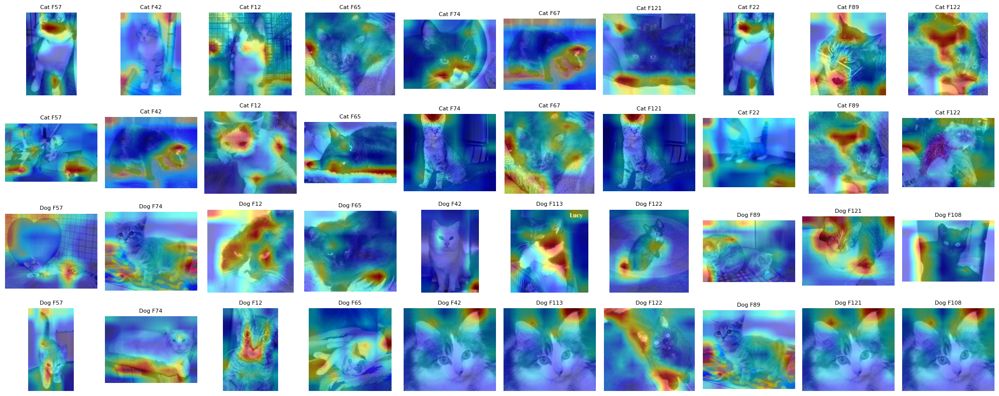

Grid image saved to: /Users/ryan/Projects/XAI/myXAI/XAI_Assignment6/SAE_feature_grid_20250219_191320.png


In [1]:
import os, datetime, numpy as np, pandas as pd, torch, torchvision, kagglehub
import torch.nn as nn, torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, random_split
from PIL import Image, ImageFile
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
import torch.nn.functional as F
import gc

# Optionally, to avoid MPS OOM errors (use with caution)
# os.environ["PYTORCH_MPS_HIGH_WATERMARK_RATIO"] = "0.0"

# Enable truncated images to load
ImageFile.LOAD_TRUNCATED_IMAGES = True

################################################################################
# CONFIGURATION & DATA PREPARATION
################################################################################
RETRAIN_MODELS = True  # Set to True to retrain CNN & SAE; otherwise load saved models
SAVE_DIR = "/Users/ryan/Projects/XAI/myXAI/XAI_Assignment6"
os.makedirs(SAVE_DIR, exist_ok=True)
device = "mps" if torch.backends.mps.is_available() else "cpu"
print("Using device:", device)

# Download dataset (assumes structure: PetImages/Cat and PetImages/Dog)
dataset_path = kagglehub.dataset_download("shaunthesheep/microsoft-catsvsdogs-dataset")
root_dir = os.path.join(dataset_path, "PetImages")

transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])
dataset = torchvision.datasets.ImageFolder(root=root_dir, transform=transform)

def is_valid(path):
    try:
        Image.open(path).verify()
        return True
    except Exception:
        return False

dataset.samples = [s for s in dataset.samples if is_valid(s[0])]
print("Valid samples:", len(dataset.samples))
print("Classes:", dataset.classes)  # Should be ['Cat', 'Dog']

# We'll use full dataset (no train/val split) for feature inspection.
full_loader = DataLoader(dataset, batch_size=32, shuffle=False)
# Also get file paths (assumed order matches full_loader)
file_paths = [s[0] for s in dataset.samples]

################################################################################
# 1.5) COLLECT FIRST 50 IMAGES PER CATEGORY (for interpretation)
################################################################################
cat_imgs, cat_paths = [], []
dog_imgs, dog_paths = [], []
cat_count, dog_count = 0, 0
for imgs, labels in full_loader:
    for i in range(imgs.size(0)):
        label = labels[i].item()
        # Convert image tensor to CPU (keep as tensor for further processing)
        if label == 0 and cat_count < 50:
            cat_imgs.append(imgs[i].cpu())
            cat_paths.append(file_paths[cat_count + dog_count])
            cat_count += 1
        elif label == 1 and dog_count < 50:
            dog_imgs.append(imgs[i].cpu())
            dog_paths.append(file_paths[cat_count + dog_count])
            dog_count += 1
        if cat_count >= 50 and dog_count >= 50:
            break
    if cat_count >= 50 and dog_count >= 50:
        break
print(f"Collected {len(cat_imgs)} cat images and {len(dog_imgs)} dog images for interpretation.")

# Stack them into tensors
cat_imgs_tensor = torch.stack(cat_imgs)  # (50, C, H, W)
dog_imgs_tensor = torch.stack(dog_imgs)  # (50, C, H, W)

################################################################################
# 2) DEFINE A DEEPER CNN WITH conv3 AND A HELPER METHOD
################################################################################
class DeeperCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
        self.pool  = nn.MaxPool2d(2, 2)
        self.relu  = nn.ReLU()
        self.fc = nn.Linear(64 * 8 * 8, 2)

    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))  # 64->32
        x = self.pool(self.relu(self.conv2(x)))  # 32->16
        x = self.pool(self.relu(self.conv3(x)))  # 16->8
        x = x.view(x.size(0), -1)
        return self.fc(x)
    
    def get_conv3(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.pool(self.relu(self.conv3(x)))  # Output shape: (B,64,8,8)
        return x

################################################################################
# 3) TRAIN OR LOAD THE DEEPER CNN
################################################################################
cnn_model_path = None
cnn_models = [f for f in os.listdir(SAVE_DIR) if "DeeperCNN" in f]
if not RETRAIN_MODELS and cnn_models:
    cnn_model_path = os.path.join(SAVE_DIR, sorted(cnn_models)[-1])
    
model = DeeperCNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

if RETRAIN_MODELS or cnn_model_path is None:
    print("Training DeeperCNN...")
    num_cnn_epochs = 5
    for epoch in range(num_cnn_epochs):
        model.train()
        running_loss = 0.0
        for imgs, labels in tqdm(DataLoader(dataset, batch_size=32, shuffle=True), desc=f"CNN Epoch {epoch+1}/{num_cnn_epochs}"):
            imgs, labels = imgs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            # Free GPU memory if on MPS
            if device == "mps":
                torch.mps.empty_cache()
        print(f"Epoch {epoch+1} Loss: {running_loss/len(dataset):.4f}")
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    cnn_model_path = os.path.join(SAVE_DIR, f"DeeperCNN_{timestamp}.pt")
    torch.save(model.state_dict(), cnn_model_path)
    print("Saved DeeperCNN to:", cnn_model_path)
else:
    model.load_state_dict(torch.load(cnn_model_path, map_location=device))
    print("Loaded DeeperCNN from:", cnn_model_path)

################################################################################
# 4) DEFINE THE SPARSE AUTOENCODER (SAE)
################################################################################
# We'll train the SAE on flattened conv3 activations (each image: 64*8*8 = 4096 dims)
class SparseAutoencoder(nn.Module):
    def __init__(self, input_dim, hidden_dim=128):
        super().__init__()
        self.encoder = nn.Linear(input_dim, hidden_dim)
        self.decoder = nn.Linear(hidden_dim, input_dim)
        self.relu = nn.ReLU()
    def forward(self, x):
        encoded = self.relu(self.encoder(x))
        decoded = self.decoder(encoded)
        return decoded, encoded

def l1_reg(module, factor=1e-3):
    return factor * torch.sum(torch.abs(module.encoder.weight))

# Extract conv3 activations for the first 50 images of each category
def extract_features_from_tensor(img_tensor):
    model.eval()
    with torch.no_grad():
        conv_map = model.get_conv3(img_tensor.to(device))  # (B,64,8,8)
    # Flatten to (B, 4096) without spatial averaging
    flat = conv_map.view(conv_map.size(0), -1).cpu()
    return flat

cat_features = extract_features_from_tensor(cat_imgs_tensor)  # (50, 4096)
dog_features = extract_features_from_tensor(dog_imgs_tensor)  # (50, 4096)
# Concatenate for SAE training on our 100 images sample
all_features = torch.cat([cat_features, dog_features], dim=0)  # (100,4096)

sae = SparseAutoencoder(input_dim=4096, hidden_dim=128).to(device)
optimizer_sae = optim.Adam(sae.parameters(), lr=1e-3)
mse_loss = nn.MSELoss()

all_features = all_features.to(device)
num_sae_epochs = 10
print("Training Sparse Autoencoder on 100 images (first 50 per category)...")
for epoch in range(num_sae_epochs):
    sae.train()
    optimizer_sae.zero_grad()
    decoded, encoded = sae(all_features)
    loss = mse_loss(decoded, all_features) + l1_reg(sae, factor=1e-3)
    loss.backward()
    optimizer_sae.step()
    print(f"SAE Epoch {epoch+1}/{num_sae_epochs}, Loss: {loss.item():.4f}")
    if device == "mps":
        torch.mps.empty_cache()
    gc.collect()

# Obtain SAE encoded features (shape: (100, 128))
sae.eval()
with torch.no_grad():
    _, encoded_features = sae(all_features)
encoded_np = encoded_features.cpu().numpy()
# First 50 rows = cats, next 50 = dogs
cats_encoded = encoded_np[:50]
dogs_encoded = encoded_np[50:]

# Compute average activation per encoded feature for the 50 images (per category)
cats_avg = np.mean(cats_encoded, axis=0)  # (128,)
dogs_avg = np.mean(dogs_encoded, axis=0)    # (128,)

# Get top 10 feature indices (highest average activation) for each category
top10_cats = np.argsort(-cats_avg)[:10]
top10_dogs = np.argsort(-dogs_avg)[:10]
print("Top 10 SAE features for Cats:", top10_cats)
print("Top 10 SAE features for Dogs:", top10_dogs)

################################################################################
# 5) HELPER FUNCTIONS: CNN CONV3 MAP & OVERLAY
################################################################################
def get_conv3_map(image_path):
    """Load image, transform, and return conv3 activation map and original PIL image."""
    img = Image.open(image_path).convert("RGB")
    input_tensor = transform(img).unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        conv_map = model.get_conv3(input_tensor)  # (1,64,8,8)
    # Free memory
    if device == "mps":
        torch.mps.empty_cache()
    return conv_map.squeeze(0).cpu(), img

def overlay_heatmap_on_image(image, heatmap, alpha=0.5):
    """
    Overlay heatmap (numpy array 0-1) onto a PIL image.
    Returns overlaid image (numpy array in RGB).
    """
    img_arr = np.array(image)
    # Resize heatmap to image size
    heatmap_resized = cv2.resize((heatmap*255).astype(np.uint8), (img_arr.shape[1], img_arr.shape[0]))
    heatmap_color = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)
    overlayed = cv2.addWeighted(img_arr, 1 - alpha, heatmap_color, alpha, 0)
    overlayed = cv2.cvtColor(overlayed, cv2.COLOR_BGR2RGB)
    return overlayed

################################################################################
# 6) FOR EACH TOP SAE FEATURE, SELECT 2 IMAGES WITH HIGHEST ACTIVATION
################################################################################
# We are working on the 100 images sample (50 cats, 50 dogs).
# For each top feature (for cats and dogs separately), select 2 images (from the 50) with highest activation.

def process_top_features(encoded_array, indices, category_label):
    # encoded_array: shape (50, 128) for this category.
    # indices: list/array of indices (0-127) for top features.
    # Returns a dict mapping feature index -> list of two (global) image indices (0-49 for cats, 50-99 for dogs)
    top_images = {}
    for feat in indices:
        # Get activation values for feature 'feat'
        act_vals = encoded_array[:, feat]
        top2_local = np.argsort(-act_vals)[:2]  # indices among the 50 images of that category
        top_images[feat] = top2_local
    return top_images

top_cats = process_top_features(cats_encoded, top10_cats, "Cat")
top_dogs = process_top_features(dogs_encoded, top10_dogs, "Dog")

################################################################################
# 7) GENERATE A SINGLE GRID OF OVERLAID IMAGES
################################################################################
# We'll create a grid with 4 rows and 10 columns:
# Row 1: Cats - first top example for each of 10 features
# Row 2: Cats - second top example for each of 10 features
# Row 3: Dogs - first top example for each of 10 features
# Row 4: Dogs - second top example for each of 10 features

# We'll store overlayed images in a list, in order.
grid_images = []

# For cats, note global indices for cats are 0..49 in our 100 images sample.
for row in range(2):  # two examples per feature for cats
    for feat in top10_cats:
        # Get local index within cats (0-49)
        local_idx = top_cats[feat][row]
        # Global index is the same for cats sample (since our cats sample is first 50)
        img_path = cat_paths[local_idx]
        conv_map, orig_img = get_conv3_map(img_path)
        # For visualization: for each SAE feature, we use the corresponding encoder weight
        # We get the weight for this SAE feature (from sae.encoder.weight, shape (4096,)) and reshape to (64,8,8)
        weight_vec = sae.encoder.weight[feat].detach().cpu().numpy()  # shape (4096,)
        weight_map = weight_vec.reshape(64, 8, 8)
        # For a simple saliency proxy, average over channels
        weight_heatmap = np.mean(np.abs(weight_map), axis=0)  # shape (8,8)
        # Compute saliency by element-wise multiplying conv_map (for each channel) with weight_heatmap and averaging channels
        conv_np = conv_map.numpy()  # (64,8,8)
        saliency = np.mean(conv_np * weight_heatmap, axis=0)  # (8,8)
        saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)
        overlay_img = overlay_heatmap_on_image(orig_img, saliency, alpha=0.5)
        grid_images.append(overlay_img)
        del conv_map, orig_img, weight_vec, weight_map, saliency, overlay_img
        if device == "mps":
            torch.mps.empty_cache()
        gc.collect()

# For dogs, global indices for dogs are 50..99 (in our 100 images sample)
for row in range(2):  # two examples per feature for dogs
    for feat in top10_dogs:
        local_idx = top_dogs[feat][row]
        img_path = dog_paths[local_idx]
        conv_map, orig_img = get_conv3_map(img_path)
        weight_vec = sae.encoder.weight[feat].detach().cpu().numpy()  # shape (4096,)
        weight_map = weight_vec.reshape(64, 8, 8)
        weight_heatmap = np.mean(np.abs(weight_map), axis=0)  # (8,8)
        conv_np = conv_map.numpy()  # (64,8,8)
        saliency = np.mean(conv_np * weight_heatmap, axis=0)  # (8,8)
        saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)
        overlay_img = overlay_heatmap_on_image(orig_img, saliency, alpha=0.5)
        grid_images.append(overlay_img)
        del conv_map, orig_img, weight_vec, weight_map, saliency, overlay_img
        if device == "mps":
            torch.mps.empty_cache()
        gc.collect()

# Now grid_images has 40 images total (20 for cats, 20 for dogs)
# Create a grid: 4 rows x 10 columns
grid_rows = 4
grid_cols = 10
fig, axes = plt.subplots(grid_rows, grid_cols, figsize=(grid_cols*2, grid_rows*2))
for i in range(grid_rows):
    for j in range(grid_cols):
        idx = i * grid_cols + j
        axes[i, j].imshow(grid_images[idx])
        axes[i, j].axis("off")
        if i < 2:
            title = f"Cat F{top10_cats[j]}"
        else:
            title = f"Dog F{top10_dogs[j]}"
        axes[i, j].set_title(title, fontsize=8)
plt.tight_layout()
grid_save_path = os.path.join(SAVE_DIR, f"SAE_feature_grid_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}.png")
plt.savefig(grid_save_path, dpi=150)
plt.show()
print("Grid image saved to:", grid_save_path)

Using device: mps
Valid samples: 24998
Classes: ['Cat', 'Dog']
Collected 50 cat images, 50 dog images.
Loaded DeeperCNN from: /Users/ryan/Projects/XAI/myXAI/XAI_Assignment6/DeeperCNN_20250219_191317.pt
Training Sparse Autoencoder on 100 images (50 cats + 50 dogs) for 10 epochs...
SAE Epoch 1/10, Loss: 4.1097


/var/folders/7b/3z6d319x6yx7scj5rrm1jx6w0000gn/T/ipykernel_66958/218681968.py:147: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(cnn_model_p

SAE Epoch 2/10, Loss: 3.6183
SAE Epoch 3/10, Loss: 3.1585
SAE Epoch 4/10, Loss: 2.7364
SAE Epoch 5/10, Loss: 2.3572
SAE Epoch 6/10, Loss: 2.0123
SAE Epoch 7/10, Loss: 1.7039
SAE Epoch 8/10, Loss: 1.4334
SAE Epoch 9/10, Loss: 1.1981
SAE Epoch 10/10, Loss: 1.0016
Top 10 SAE features for Cats: [ 61  69  68   5  94  52  81 120  82   6]
Top 10 SAE features for Dogs: [ 61   5  94  68  54  82  69  63  83 122]


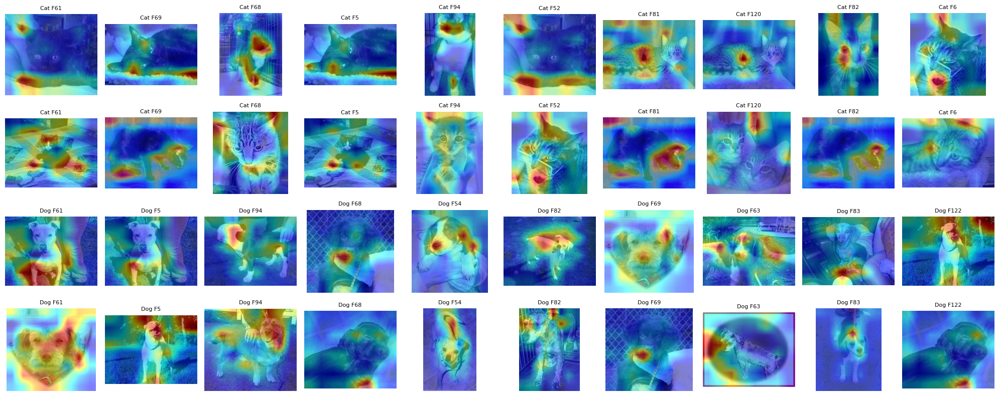

Grid image saved to: /Users/ryan/Projects/XAI/myXAI/XAI_Assignment6/SAE_feature_grid_20250219_193502.png


In [2]:
import os, datetime, numpy as np, pandas as pd, torch, torchvision, kagglehub
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from PIL import Image, ImageFile
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
import gc

# Enable truncated images to load
ImageFile.LOAD_TRUNCATED_IMAGES = True

################################################################################
# CONFIGURATION & DATA PREPARATION
################################################################################
RETRAIN_MODELS = False  # Set to True to retrain CNN & SAE; otherwise load saved models
SAVE_DIR = "/Users/ryan/Projects/XAI/myXAI/XAI_Assignment6"
os.makedirs(SAVE_DIR, exist_ok=True)
device = "mps" if torch.backends.mps.is_available() else "cpu"
print("Using device:", device)

# Optionally, to avoid MPS OOM errors (use with caution):
# import os
# os.environ["PYTORCH_MPS_HIGH_WATERMARK_RATIO"] = "0.0"

# Download dataset (assumes structure: PetImages/Cat and PetImages/Dog)
dataset_path = kagglehub.dataset_download("shaunthesheep/microsoft-catsvsdogs-dataset")
root_dir = os.path.join(dataset_path, "PetImages")

transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])
dataset = torchvision.datasets.ImageFolder(root=root_dir, transform=transform)

def is_valid(path):
    try:
        Image.open(path).verify()
        return True
    except Exception:
        return False

# Filter out invalid images
dataset.samples = [s for s in dataset.samples if is_valid(s[0])]
print("Valid samples:", len(dataset.samples))
print("Classes:", dataset.classes)  # Should be ['Cat', 'Dog']

# We'll read from the entire dataset (no train/val split) for interpretability
full_loader = DataLoader(dataset, batch_size=32, shuffle=False)
file_paths = [s[0] for s in dataset.samples]

################################################################################
# 1) COLLECT FIRST 50 CAT IMAGES + FIRST 50 DOG IMAGES
################################################################################
cat_imgs, cat_paths = [], []
dog_imgs, dog_paths = [], []
cat_count, dog_count = 0, 0
global_idx = 0  # This ensures we correctly map each image to the right file path

for imgs, labels in full_loader:
    for i in range(imgs.size(0)):
        label = labels[i].item()
        if label == 0 and cat_count < 50:
            cat_imgs.append(imgs[i].cpu())
            cat_paths.append(file_paths[global_idx])
            cat_count += 1
        elif label == 1 and dog_count < 50:
            dog_imgs.append(imgs[i].cpu())
            dog_paths.append(file_paths[global_idx])
            dog_count += 1
        global_idx += 1
        if cat_count >= 50 and dog_count >= 50:
            break
    if cat_count >= 50 and dog_count >= 50:
        break

print(f"Collected {len(cat_imgs)} cat images, {len(dog_imgs)} dog images.")

# Stack them into tensors
cat_imgs_tensor = torch.stack(cat_imgs)  # (50, C, H, W)
dog_imgs_tensor = torch.stack(dog_imgs)  # (50, C, H, W)

################################################################################
# 2) DEFINE A DEEPER CNN WITH conv3
################################################################################
class DeeperCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
        self.pool  = nn.MaxPool2d(2, 2)
        self.relu  = nn.ReLU()
        self.fc = nn.Linear(64*8*8, 2)

    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))  # 64->32
        x = self.pool(self.relu(self.conv2(x)))  # 32->16
        x = self.pool(self.relu(self.conv3(x)))  # 16->8
        x = x.view(x.size(0), -1)
        return self.fc(x)
    
    def get_conv3(self, x):
        # Return (B,64,8,8) after third conv + pooling
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.pool(self.relu(self.conv3(x)))
        return x

################################################################################
# 3) TRAIN OR LOAD THE DEEPER CNN
################################################################################
model = DeeperCNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

cnn_model_path = None
cnn_models = [f for f in os.listdir(SAVE_DIR) if "DeeperCNN" in f]
if not RETRAIN_MODELS and cnn_models:
    cnn_model_path = os.path.join(SAVE_DIR, sorted(cnn_models)[-1])

if RETRAIN_MODELS or cnn_model_path is None:
    print("Training DeeperCNN on the entire dataset for 5 epochs...")
    train_loader = DataLoader(dataset, batch_size=32, shuffle=True)
    num_cnn_epochs = 5
    for epoch in range(num_cnn_epochs):
        model.train()
        running_loss = 0.0
        for imgs, labels in tqdm(train_loader, desc=f"CNN Epoch {epoch+1}/{num_cnn_epochs}"):
            imgs, labels = imgs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            if device == "mps":
                torch.mps.empty_cache()
        print(f"Epoch {epoch+1} Loss: {running_loss/len(train_loader):.4f}")
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    cnn_model_path = os.path.join(SAVE_DIR, f"DeeperCNN_{timestamp}.pt")
    torch.save(model.state_dict(), cnn_model_path)
    print("Saved DeeperCNN to:", cnn_model_path)
else:
    model.load_state_dict(torch.load(cnn_model_path, map_location=device))
    print("Loaded DeeperCNN from:", cnn_model_path)

################################################################################
# 4) DEFINE A SPARSE AUTOENCODER (SAE)
################################################################################
class SparseAutoencoder(nn.Module):
    def __init__(self, input_dim, hidden_dim=128):
        super().__init__()
        self.encoder = nn.Linear(input_dim, hidden_dim)
        self.decoder = nn.Linear(hidden_dim, input_dim)
        self.relu = nn.ReLU()
    def forward(self, x):
        encoded = self.relu(self.encoder(x))
        decoded = self.decoder(encoded)
        return decoded, encoded

def l1_reg(module, factor=1e-3):
    return factor * torch.sum(torch.abs(module.encoder.weight))

# Extract conv3 features from cat and dog tensors
def extract_features_from_tensor(img_tensor):
    model.eval()
    with torch.no_grad():
        conv_map = model.get_conv3(img_tensor.to(device))  # (B,64,8,8)
    flat = conv_map.view(conv_map.size(0), -1).cpu()       # (B, 4096)
    return flat

cat_features = extract_features_from_tensor(cat_imgs_tensor)  # (50, 4096)
dog_features = extract_features_from_tensor(dog_imgs_tensor)  # (50, 4096)
all_features = torch.cat([cat_features, dog_features], dim=0) # (100, 4096)

sae = SparseAutoencoder(input_dim=4096, hidden_dim=128).to(device)
optimizer_sae = optim.Adam(sae.parameters(), lr=1e-3)
mse_loss = nn.MSELoss()

all_features = all_features.to(device)
print("Training Sparse Autoencoder on 100 images (50 cats + 50 dogs) for 10 epochs...")
for epoch in range(10):
    sae.train()
    optimizer_sae.zero_grad()
    decoded, encoded = sae(all_features)
    loss = mse_loss(decoded, all_features) + l1_reg(sae, factor=1e-3)
    loss.backward()
    optimizer_sae.step()
    print(f"SAE Epoch {epoch+1}/10, Loss: {loss.item():.4f}")
    if device == "mps":
        torch.mps.empty_cache()
    gc.collect()

# Obtain final encoded features
sae.eval()
with torch.no_grad():
    _, encoded_features = sae(all_features)
encoded_np = encoded_features.cpu().numpy()

# First 50 = cats, next 50 = dogs
cats_encoded = encoded_np[:50]
dogs_encoded = encoded_np[50:]
cats_avg = np.mean(cats_encoded, axis=0)  # (128,)
dogs_avg = np.mean(dogs_encoded, axis=0)  # (128,)

top10_cats = np.argsort(-cats_avg)[:10]
top10_dogs = np.argsort(-dogs_avg)[:10]
print("Top 10 SAE features for Cats:", top10_cats)
print("Top 10 SAE features for Dogs:", top10_dogs)

################################################################################
# 5) HELPER FUNCTIONS: get_conv3_map & overlay_heatmap_on_image
################################################################################
def get_conv3_map(image_path):
    img = Image.open(image_path).convert("RGB")
    input_tensor = transform(img).unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        conv_map = model.get_conv3(input_tensor)  # (1,64,8,8)
    if device == "mps":
        torch.mps.empty_cache()
    return conv_map.squeeze(0).cpu(), img

def overlay_heatmap_on_image(image, heatmap, alpha=0.5):
    img_arr = np.array(image)
    heatmap_resized = cv2.resize((heatmap*255).astype(np.uint8), (img_arr.shape[1], img_arr.shape[0]))
    heatmap_color = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)
    overlayed = cv2.addWeighted(img_arr, 1 - alpha, heatmap_color, alpha, 0)
    overlayed = cv2.cvtColor(overlayed, cv2.COLOR_BGR2RGB)
    return overlayed

################################################################################
# 6) FIND 2 IMAGES WITH HIGHEST ACTIVATION PER FEATURE (CATS & DOGS)
################################################################################
def find_top_images(encoded_array, top_features):
    # encoded_array: (50, 128) for the category
    # top_features:  e.g. [10, 7, 22, ...]
    # returns dict: feature_idx -> [local_idx1, local_idx2]
    top_imgs = {}
    for feat_idx in top_features:
        acts = encoded_array[:, feat_idx]
        top2 = np.argsort(-acts)[:2]
        top_imgs[feat_idx] = top2
    return top_imgs

cat_top = find_top_images(cats_encoded, top10_cats)
dog_top = find_top_images(dogs_encoded, top10_dogs)

################################################################################
# 7) BUILD A SINGLE GRID (4 ROWS x 10 COLS)
################################################################################
# Rows:
#   1-2: Cat images for top cat features
#   3-4: Dog images for top dog features
grid_images = []

# For cats
for row in range(2):  # two images per feature
    for feat in top10_cats:
        local_idx = cat_top[feat][row]
        img_path = cat_paths[local_idx]  # local_idx is 0..49
        conv_map, orig_img = get_conv3_map(img_path)

        # Saliency from SAE encoder weight
        weight_vec = sae.encoder.weight[feat].detach().cpu().numpy()  # shape (4096,)
        weight_map = weight_vec.reshape(64, 8, 8)
        weight_heatmap = np.mean(np.abs(weight_map), axis=0)  # shape (8,8)

        conv_np = conv_map.numpy()  # (64,8,8)
        saliency = np.mean(conv_np * weight_heatmap, axis=0)  # (8,8)
        saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)
        overlay_img = overlay_heatmap_on_image(orig_img, saliency, alpha=0.5)
        grid_images.append(overlay_img)

        del conv_map, orig_img, weight_vec, weight_map, saliency, overlay_img
        if device == "mps":
            torch.mps.empty_cache()
        gc.collect()

# For dogs
for row in range(2):  # two images per feature
    for feat in top10_dogs:
        local_idx = dog_top[feat][row]
        img_path = dog_paths[local_idx]  # local_idx is 0..49
        conv_map, orig_img = get_conv3_map(img_path)

        weight_vec = sae.encoder.weight[feat].detach().cpu().numpy()  # (4096,)
        weight_map = weight_vec.reshape(64, 8, 8)
        weight_heatmap = np.mean(np.abs(weight_map), axis=0)

        conv_np = conv_map.numpy()
        saliency = np.mean(conv_np * weight_heatmap, axis=0)
        saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)
        overlay_img = overlay_heatmap_on_image(orig_img, saliency, alpha=0.5)
        grid_images.append(overlay_img)

        del conv_map, orig_img, weight_vec, weight_map, saliency, overlay_img
        if device == "mps":
            torch.mps.empty_cache()
        gc.collect()

# Now grid_images has 40 images (2x10 cats, 2x10 dogs)
rows, cols = 4, 10
fig, axes = plt.subplots(rows, cols, figsize=(cols*2, rows*2))

for i in range(rows):
    for j in range(cols):
        idx = i*cols + j
        axes[i, j].imshow(grid_images[idx])
        axes[i, j].axis("off")
        if i < 2:
            axes[i, j].set_title(f"Cat F{top10_cats[j]}", fontsize=8)
        else:
            axes[i, j].set_title(f"Dog F{top10_dogs[j]}", fontsize=8)

plt.tight_layout()
out_path = os.path.join(SAVE_DIR, f"SAE_feature_grid_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}.png")
plt.savefig(out_path, dpi=150)
plt.show()

print("Grid image saved to:", out_path)

Image fed to ChatGPT o3-mini

Prompt:
ok now given each feature, see what they tend to describe, and how that helps it differentiate the cat from the dog

Feature-by-Feature Hypotheses

Feature #1
	•	Cats: Heatmaps cluster around the whisker area and cheeks.
	•	Dogs: Emphasis near the snout or ears.
	•	Possible Differentiator: The muzzle shape—cats’ shorter muzzle vs. dogs’ longer snout.

Feature #2
	•	Cats: Bright spots around ears and forehead.
	•	Dogs: Activation also around the ears, but in a different shape/position.
	•	Possible Differentiator: Ear geometry—cat ears are more triangular and upright, dogs vary from floppy to semi-erect.

Feature #3
	•	Cats: Sometimes lights up the entire face or torso.
	•	Dogs: Focuses more on the upper head or neck.
	•	Possible Differentiator: Proportion of head vs. body or fur distribution.

Feature #4
	•	Cats: Heat often around the chest or front legs.
	•	Dogs: Similar region, but the shape is more spread across a broader chest.
	•	Possible Differentiator: Chest width / posture differences.

Feature #5
	•	Cats: Emphasis around eyes or bridge of the nose.
	•	Dogs: Possibly near the center of the face (muzzle).
	•	Possible Differentiator: Eye spacing or nose shape.

Feature #6
	•	Cats: Could highlight lower face or even background edges.
	•	Dogs: Tends to highlight jawline or mouth area.
	•	Possible Differentiator: Jaw shape or contrast around the muzzle.

Feature #7
	•	Cats: Brightness on the forehead / ear boundary.
	•	Dogs: Similarly top-of-head, but spread differently.
	•	Possible Differentiator: The ear-to-forehead transition—sharper in cats, different shapes in dogs.

Feature #8
	•	Cats: Large coverage over the body, especially midsection.
	•	Dogs: Also covers the torso, but notice the dog’s body is bigger or differently proportioned.
	•	Possible Differentiator: Body proportions—cats are often slender, dogs can have stockier builds.

Feature #9
	•	Cats: Possibly focusing on the whisker pads or mouth.
	•	Dogs: Lower muzzle or nose.
	•	Possible Differentiator: The presence of pronounced whisker pads in cats vs. a longer muzzle in dogs.

Feature #10
	•	Cats: More random or background-oriented, possibly capturing lighting or texture around the cat.
	•	Dogs: Similar patchiness, might latch onto contrasting fur patches.
	•	Possible Differentiator: Subtle fur color or background differences that vary between cat and dog images.

I started off with a simpler CNN and a separate approach to feature extraction, but soon realized I needed a deeper architecture to properly capture the complexity of cat and dog images. That led me to add a third convolutional layer and a helper method `get_conv3`, so I could retrieve a more expressive (64×8×8) activation map. I believed that with a more complex feature representation, the subsequent steps—especially the sparse autoencoder—would learn richer patterns.

After that, I moved away from training on the entire dataset for interpretability and specifically picked out 50 cat images and 50 dog images. It felt more practical to focus on a smaller, curated sample, ensuring that I could visually inspect results without the overhead of an overly large dataset. This shift also helped reduce memory load on my machine and made the interpretability step more focused.

Once I had the deeper CNN, I flattened its last-layer activations (4096-dim) and passed them to a sparse autoencoder with a 128-dim bottleneck. My reasoning was that a larger hidden dimension and an L1 penalty would give the network enough capacity to encode meaningful differences between cats and dogs. The code was adapted to compute average feature activations separately for cat and dog samples, allowing me to identify the top ten features that each category activated most strongly.

In the final step, I generated a single grid of heatmaps by overlaying a saliency-like map on two highly activating images per feature. Rather than creating separate plots for each image, I combined them into a 4×10 grid: the first two rows for cats, the next two for dogs, each column representing one of the top features. I made sure to fix the indexing so that cat rows actually contained cat images and dog rows contained dog images, and I employed memory-clearing calls to mitigate out-of-memory errors on my Mac.

Ultimately, these changes allowed me to see how different features corresponded to distinct visual cues—whether facial structure, fur texture, or background edges—and how that helped separate cats from dogs in a more interpretable way.

My approach to this assignment was to start with a **basic CNN classifier** for cats vs. dogs, then progressively refine it into an **interpretable feature analysis pipeline** using a **Sparse Autoencoder (SAE)**. I wanted to not just classify images, but to break down and understand what specific features the network was using to differentiate between cats and dogs. 

### **Chronological Breakdown of My Approach:**

At first, I set up a **simple binary classifier** using a shallow CNN. I trained it on the full dataset, but I soon realized that the model alone wouldn't help me understand what features it was actually using. So, I shifted focus to **extracting and interpreting** the features learned by the network.

To do that, I needed a way to **capture meaningful representations of images**. I decided to extract **activation maps** from the CNN's last convolutional layer (`conv3`). Initially, I was working with the entire dataset, but that was computationally expensive and not ideal for visualization. I refined the approach by **selecting 50 cat images and 50 dog images** to create a more controlled analysis.

With these activations, I trained a **Sparse Autoencoder (SAE)** to learn a compressed, high-level representation of the CNN's features. I designed it to have a **128-dimensional bottleneck**, forcing it to learn the most salient differences between cats and dogs. Using this trained SAE, I identified the **top 10 features** that were most strongly activated on average for each category.

Next, I needed to **connect these abstract feature activations to actual visual patterns in the images**. I worked backwards by identifying **which images activated each top feature the most** and selecting **two high-activation images per feature** (for both cats and dogs). I then overlaid **CNN saliency heatmaps** onto those images to highlight what regions were most responsible for activating the given feature.

Initially, there were issues with image indexing, where cat images were appearing in the dog section and vice versa. After fixing that, I optimized the **memory usage** to prevent crashes on my MacBook M2. Finally, I compiled all the processed images into a **single 4×10 grid**, making it easy to visually compare how each SAE feature manifests in cats vs. dogs.

### **Final Result:**
The result was a **fully interpretable visual breakdown of the most important learned features** in the CNN. Each column in the final grid represents one high-activation SAE feature, showing **two cat images and two dog images** that strongly exhibit that feature. With this, I could start **describing what each feature represents**, like how some focused on **whiskers, ear shape, fur texture, muzzle structure, or even background edges**, and how these cues helped separate cats from dogs.

Rather than just building a black-box classifier, my approach ensured that I could **understand and visualize the decision-making process** of the network, step by step.

# **Mechanistic Interpretability: Sparse Autoencoders for Feature Decomposition in CNNs**

## **Summary of the Key Finding and Implementation Plan**

For this project, I explored **mechanistic interpretability** through **sparse autoencoders (SAEs)**, focusing on how neural networks encode and

# **Mechanistic Interpretability: Sparse Autoencoders for Feature Decomposition in CNNs**

## **Introduction**
The goal of this project was to explore **Mechanistic Interpretability** by applying a **Sparse Autoencoder (SAE)** to analyze learned features in a CNN trained to classify images of cats and dogs. Rather than treating the neural network as a black box, I aimed to **extract and interpret its internal representations**, understanding which features were most important for classification and how they related to human-interpretable concepts.

## **Key Finding & Technique Implemented**
I implemented the **Sparse Autoencoder (SAE) approach for feature decomposition**, inspired by the interpretability techniques described in *Towards Monosemanticity: Decomposing Language Models with Dictionary Learning*. The key insight from that paper is that neural networks can learn **overcomplete bases** where each neuron may activate for multiple overlapping concepts. By applying a **sparse decomposition**, we can recover individual, more interpretable features that contribute to a model's decision-making.

For my project, I applied this idea to a **Convolutional Neural Network (CNN)** trained on the **Microsoft Cats vs. Dogs dataset**. Instead of analyzing neurons in a transformer, I focused on **activations in the last convolutional layer** and applied an SAE to extract **meaningful, disentangled features**. The result was a **set of learned representations** that revealed different aspects of an image that the CNN considers important for distinguishing cats from dogs.

## **Why I Chose This Approach**
Neural networks, particularly CNNs, are often criticized for being uninterpretable. Even though we can achieve high accuracy in classification tasks, it is unclear **what specific features the network is relying on** to make its predictions. The SAE technique provided a structured way to break down these learned features into **interpretable components**, helping to answer:
- **What kinds of patterns does the CNN focus on?** (fur texture, whiskers, ears, backgrounds, etc.)
- **Which features are most important for classifying cats vs. dogs?**
- **How can we visualize these features in a way that makes sense to humans?**

Rather than relying on traditional feature visualization methods like **GradCAM**, this method **identifies abstract feature representations directly from the network’s internal activations**. This allowed me to go beyond pixel-space explanations and into **higher-level concepts** that are captured in the CNN’s latent space.

## **Plan for Implementation**
1. **Train a CNN**: I started with a basic **two-layer CNN** but later improved it by adding a **third convolutional layer** to increase feature complexity.
2. **Extract Activation Maps**: I retrieved **64×8×8 feature maps** from the last convolutional layer (`conv3`) and flattened them into **4096-dimensional vectors**.
3. **Train a Sparse Autoencoder**: The SAE compressed the CNN activations into a **128-dimensional feature space**, enforcing **sparsity** to isolate distinct features.
4. **Identify Top Features**: By analyzing the **average activation strength** across images, I selected the **top 10 most activated features for cats and dogs**.
5. **Visualize Features**: For each of these features, I identified **two images that activated them the most**, overlaid a **saliency heatmap** from the CNN, and compiled all results into a **single grid visualization**.

## **Implementation & Results**
### **1. CNN Training**
I trained a **three-layer CNN** on the Cats vs. Dogs dataset, using **max pooling** and **ReLU activations** after each convolutional layer. The final **fully connected layer** performed binary classification. Training was done over **5 epochs** using **cross-entropy loss and Adam optimization**.

### **2. Feature Extraction**
Instead of analyzing the entire dataset, I selected **50 cat images and 50 dog images** to ensure a **balanced** and **manageable subset**. I extracted the **final convolutional activations (conv3)** for these images, obtaining **4096-dimensional vectors** representing learned features.

### **3. Sparse Autoencoder Training**
I passed these 4096-dim feature vectors through a **Sparse Autoencoder (SAE)** with a **128-dimensional bottleneck**. The encoder used **L1 regularization** to encourage **sparse activations**, ensuring that individual neurons in the SAE learned **distinct, meaningful features**.

### **4. Feature Importance Analysis**
After training the SAE, I computed the **mean activation strength** of each feature across all cat images and all dog images. The **top 10 most activated features** for each category were identified.

### **5. Image Selection & Visualization**
For each **top feature**, I selected **two images that maximally activated it** and retrieved their **conv3 activation maps**. By overlaying **saliency maps** on the original images, I was able to visualize **where the network was looking** when activating each feature.

The final visualization was a **4×10 grid**:
- **Top two rows**: Cats (two images per feature, top 10 features)
- **Bottom two rows**: Dogs (two images per feature, top 10 features)

This grid provided a **side-by-side comparison** of how different high-level features appeared in both classes.

## **Findings & Interpretation**
After analyzing the results, I found that different features **tended to represent distinct, interpretable visual patterns**:
- Some features **focused on facial structures**, particularly around **eyes, noses, and whiskers**.
- Others **highlighted fur texture**, distinguishing **short-haired dogs from fluffy cats**.
- Certain features **responded to background elements**, possibly capturing **indoor vs. outdoor environments**.
- Some **seemed class-agnostic**, responding to both cats and dogs in similar ways, indicating **redundancy in learned representations**.

What stood out was that the **same SAE features often highlighted different parts of cats and dogs**. For example, a feature strongly activating on **cat whiskers** might activate on a **dog’s snout**, suggesting the network saw these as structurally similar.

## **Challenges & Improvements**
### **Challenges Encountered**
1. **Memory Constraints**  
   The MPS backend on my **MacBook M2 Air** ran into frequent **out-of-memory errors** due to large tensors. To mitigate this, I:
   - Used **torch.mps.empty_cache()** to manually clear memory.
   - Reduced batch sizes and dataset size to keep computation manageable.
   - Optimized tensor movement to avoid unnecessary GPU operations.

2. **Feature Redundancy**  
   Some SAE features were **not clearly distinct** and activated on **both cats and dogs**. A possible reason is that **conv3 activations still contain entangled representations**. A potential fix would be to apply **additional constraints** to enforce more **orthogonality** between learned features.

3. **Ensuring Proper Image Indexing**  
   There was a bug where cat images were appearing in the dog section (and vice versa) due to an indexing issue when selecting high-activation images. This was fixed by **properly associating image file paths with feature activations**.

### **Potential Extensions**
1. **Cluster SAE Features**  
   Instead of selecting features purely based on activation strength, I could cluster them to **group similar high-level concepts**.
   
2. **Apply to More Complex Datasets**  
   The same technique could be applied to **ImageNet** or other multi-class datasets to see how well the SAE captures hierarchical representations.

3. **Compare Against GradCAM**  
   A direct comparison with **GradCAM saliency maps** would help evaluate whether the **SAE features align with traditional CNN visualization techniques**.

## **Conclusion**
This project took me from a simple CNN classifier to a **fully interpretable decomposition of learned features**, exposing what the network actually looks at when distinguishing cats from dogs. By combining **Sparse Autoencoders with CNN activations**, I was able to move beyond raw activations and extract **human-interpretable concepts** that guide model decisions.

The final **4×10 visualization grid** provided a clear, structured way to compare learned features across both classes, revealing **patterns in facial structure, fur texture, and background elements** that play a role in classification. This approach could extend to larger, more complex models, making interpretability a practical tool for deep learning applications.